In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import matplotlib.pyplot as plt
from tqdm import tqdm  # For progress tracking
import seaborn as sns
import pandas as pd
import numpy as np
import requests
import os

# Physicochemical analysis of SMILES - Load Functions


inspired from: https://www.kaggle.com/code/naveedulattock/chemical-property-calculation-with-rdkit

In [5]:
!pip install rdkit-pypi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.4/29.4 MB 49.9 MB/s eta 0:00:00


In [25]:
import rdkit.Chem.AllChem
import rdkit.Chem
from rdkit import Chem
from rdkit.Chem import Descriptors
import rdkit.Chem.QED
import numpy as np
from rdkit.Chem.FilterCatalog import *
from rdkit.Chem import rdfiltercatalog
from rdkit.Chem.Scaffolds import MurckoScaffold
import sys
# run this cell 2 times always in order to not get an error

In [26]:
!wget https://raw.githubusercontent.com/rdkit/rdkit/master/Contrib/SA_Score/sascorer.py
!wget https://raw.githubusercontent.com/rdkit/rdkit/master/Contrib/SA_Score/fpscores.pkl.gz

--2025-06-30 15:47:49--  https://raw.githubusercontent.com/rdkit/rdkit/master/Contrib/SA_Score/sascorer.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5913 (5.8K) [text/plain]
Saving to: ‘sascorer.py.1’

sascorer.py.1       100%[===================>]   5.77K  --.-KB/s    in 0s      

2025-06-30 15:47:49 (45.6 MB/s) - ‘sascorer.py.1’ saved [5913/5913]

--2025-06-30 15:47:49--  https://raw.githubusercontent.com/rdkit/rdkit/master/Contrib/SA_Score/fpscores.pkl.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3848394 (3.7M) [app

In [8]:
from rdkit.Chem import Draw, rdMolDescriptors
from collections import Counter
import matplotlib.pyplot as plt
import io
from PIL import Image

In [27]:
import sascorer

In [10]:
# Compute molecular properties for a SMILES
def compute_properties(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None, None, None, None, None, None, None, None  # Handle invalid SMILES

    # Compute the Murcko scaffold
    scaffold = MurckoScaffold.GetScaffoldForMol(mol)
    scaffold_smiles = Chem.MolToSmiles(scaffold) if scaffold else None

    # Compute SA score
    sa_score = sascorer.calculateScore(mol)

    return (
        Descriptors.MolWt(mol),
        Descriptors.TPSA(mol),
        Descriptors.NumHDonors(mol),
        Descriptors.NumHAcceptors(mol),
        Descriptors.NumRotatableBonds(mol),
        Descriptors.NumAromaticRings(mol),
        Descriptors.HeavyAtomCount(mol),
        scaffold_smiles,  # Add the scaffold SMILES representation
        sa_score  # Add SA score

    )

In [11]:
def extract_scaffold(smiles):
    ''' Extract the Murko scaffold from a given SMILES string.'''

    mol = Chem.MolFromSmiles(smiles)
    if mol:
        #scaffold = rdMolDescriptors.MurckoScaffoldSmiles(mol=mol)
        # Compute the Murcko scaffold
        scaffold = MurckoScaffold.GetScaffoldForMol(mol)
        scaffold_smiles = Chem.MolToSmiles(scaffold) if scaffold else None
        return scaffold_smiles
    return None

def generate_scaffold_image(smiles_list, top_n=10, dataset_name=None, save=False, output_dir="outputs"):
    """Generates an image of the most common Murcko scaffolds."""

    # Extract scaffolds and filter out None values
    scaffolds = [extract_scaffold(smiles) for smiles in smiles_list]
    scaffolds = [s for s in scaffolds if s is not None]  # Remove None values

    # Count occurrences of scaffolds
    scaffold_counts = Counter(scaffolds).most_common(top_n)

    # Convert scaffold SMILES to RDKit molecules
    mols = [Chem.MolFromSmiles(scaffold) for scaffold, _ in scaffold_counts]
    labels = [f'{count}' for _, count in scaffold_counts]  # Use only count for labels

    # Generate the scaffold image grid
    img = Draw.MolsToGridImage(mols, molsPerRow=5, subImgSize=(200, 200), legends=labels, returnPNG=False)
    '''
    # Convert image to a format that can be displayed
    img_bytes = io.BytesIO()
    img.save(img_bytes, format='PNG')
    img_bytes.seek(0)

    # Display the image
    image = Image.open(img_bytes)
    image.show()
    '''
    return img  # Return scaffold frequency info

In [12]:
def sanitize_filename(name):
    """Sanitize dataset name for filenames."""
    return name.strip().replace(" ", "_").replace("/", "_")

# Unified analysis pipeline
def analyze_molecules(df, smiles_column, valid_column=None, dataset_name="Dataset", save_plots=False, output_dir="plots"):
    print(f"Starting analysis for: {dataset_name}")
    tqdm.pandas()
    dataset_name_sanitized = sanitize_filename(dataset_name)

    if save_plots:
        os.makedirs(output_dir, exist_ok=True)

    if valid_column:
       # Filter to only valid SMILES
        df = df.query(f"{valid_column} != 0")

    # Compute molecular properties
    df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
        df[smiles_column].progress_apply(lambda smi: pd.Series(compute_properties(smi)))

    print("Molecular property computation complete!")

    # Plot distributions of properties
    properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]
    num_plots = len(properties) + 1

    scaffold_counts = df["Scaffolds"].value_counts().reset_index()
    scaffold_counts.columns = ["Scaffold", "Count"]

    plt.figure(figsize=(14, 10))
    plt.suptitle(f"Distribution of Physicochemical Properties ({dataset_name})", fontsize=16, fontweight="bold")

    for i, prop in enumerate(properties, 1):
        plt.subplot(3, 3, i)
        #sns.histplot(df[prop], bins=50, kde=True, color="royalblue")
        sns.histplot(df[prop], bins=50, kde=True, stat="density", color="royalblue")
        plt.title(prop)
        plt.xlabel(prop)
        plt.ylabel("Density")

    plt.subplot(3, 3, num_plots)
    sns.histplot(scaffold_counts["Count"], bins=50, kde=True, stat="density", color="royalblue")
    plt.title("Scaffold Distribution")
    plt.xlabel("Number of Compounds per Scaffold")
    plt.ylabel("Density")

    plt.tight_layout()
    if save_plots:
        plt.savefig(os.path.join(output_dir, f"{dataset_name_sanitized}_physicochemical_distributions.png"), dpi=300)
    plt.show()

    # Scaffold image
    scaffold_img = generate_scaffold_image(list(df[smiles_column]), top_n=20)
    if save_plots:
        scaffold_img_path = os.path.join(output_dir, f"{dataset_name_sanitized}_scaffolds.png")
        scaffold_img.save(scaffold_img_path)
        print(f"Scaffolds Saved: {scaffold_img_path}")


    # === Compute SA Score Statistics ===
    if "SAScore" in df.columns:
        sa_mean = df["SAScore"].mean()
        sa_std = df["SAScore"].std()
        print(f"Synthetic Accessibility Score - Mean: {sa_mean:.3f}, SD: {sa_std:.3f}")

    print(f"Analysis complete for: {dataset_name}")
    return df

In [13]:
def valid_plot(df, smiles_column, valid_column=None, dataset_name="Dataset", save_plots=False, output_dir="plots"):
    dataset_name_sanitized = sanitize_filename(dataset_name)

    # If 'valid_column' provided, show validity plot and filter valid
    if valid_column:
        print('The generation has happened for ' + str(len(df['protein_id'].value_counts())) + ' proteins')

        counts = df.groupby('clan_name')[valid_column].value_counts(normalize=False).unstack(fill_value=0)
        if 0 in counts.columns:
            counts = counts[[0, 1]]
        proportions = counts.div(counts.sum(axis=1), axis=0)

        fig, ax = plt.subplots(figsize=(14, 10))

        proportions.sort_values(by=1, ascending=True).plot(
            kind='barh', stacked=True, color=['lightgray', 'steelblue'], ax=ax
        )

        ax.set_xlabel('Proportion', fontsize=14)
        ax.set_ylabel('Protein Family', fontsize=14)
        ax.set_title(f'Proportion of Valid SMILES per Protein Family ({dataset_name})', fontsize=16)

        # Adjust tick label size and spacing
        ax.tick_params(axis='y', labelsize=12)
        ax.tick_params(axis='x', labelsize=14)

        plt.subplots_adjust(left=0.3, right=0.95, top=0.9, bottom=0.1)  # More space on the left for long names

        #plt.tight_layout()
        if save_plots:
            plt.savefig(os.path.join(output_dir, f"{dataset_name_sanitized}_validity_proportions_h.png"), dpi=300,  bbox_inches='tight')
        plt.show()

        validity_proportions = proportions[1]
        print(f"Validity Proportion - Mean: {validity_proportions.mean():.3f}, SD: {validity_proportions.std():.3f}")

        # Filter to only valid SMILES
        df = df.query(f"{valid_column} != 0")

        # analyze duplicates
        smiles_counts = df.groupby(['clan_name', smiles_column]).size().reset_index(name='count')
        summary = smiles_counts.groupby('clan_name').agg(
            total_unique_smiles=('smiles', 'count'),
            smiles_with_duplicates=('count', lambda x: (x > 1).sum())
        ).reset_index()
        summary['proportion_duplicates'] = summary['smiles_with_duplicates'] / summary['total_unique_smiles']

        plt.figure(figsize=(12, 6))
        plt.bar(summary['clan_name'], summary['proportion_duplicates'], color='#D4A017')
        plt.xticks(rotation=45, ha='right')
        plt.ylabel('Proportion of duplicated SMILES')
        plt.xlabel('Protein Name')
        plt.title(f'Proportion of SMILES Occurring Multiple Times per Protein ({dataset_name})')
        plt.tight_layout()
        if save_plots:
            plt.savefig(os.path.join(output_dir, f"{dataset_name_sanitized}_duplicates.png"), dpi=300)
        plt.show()

        print(f"Duplicate Proportion - Mean: {summary['proportion_duplicates'].mean():.3f}, SD: {summary['proportion_duplicates'].std():.3f}")



# Load Family Data

In [14]:
# Pfams with family name
pfam_df = pd.read_csv("/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/Pfam-A.clans.tsv.gz", sep='\t', names=['pfam_id', 'pfam_cl_id', 'pfam_name', 'clan_id', 'clan_name'])
plinder_pfam_unique = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plinder_pfams.csv', index_col=0)
pdb_uniprot = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/pdb_to_uniprot.csv')

In [15]:
pfam_df_merged = plinder_pfam_unique.merge(pfam_df[['pfam_id', 'pfam_name', 'clan_name']], left_on='Pfam_Families', right_on='pfam_id', how='left')
plinder_uniprot_pfam = pd.merge(pdb_uniprot, pfam_df_merged, left_on='uniprot_id', right_on='Protein_ID')
plinder_uniprot_pfam = plinder_uniprot_pfam.drop('Protein_ID', axis=1)

In [16]:
indomain_novirus = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/Indomain_top50_novirus_balanced.csv')
indomain_novirus = indomain_novirus.loc[:, ~indomain_novirus.columns.str.contains('^Unnamed')]
indomain_novirus['pdb_id'] = indomain_novirus['pdb_id'].str.lower()
indomain_novirus

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase
1,4fi7,4fi7__1__1.A_2.A__1.C__1.C,1,train,4fi7__1__1.A_2.A__1.C,O=S(=O)(F)C1=CC=CC(C2=NN=C(C3=CC(Cl)=C(O)C(Cl)...,P02766,PF00576,PF00576,Transthyretin,HIUase/Transthyretin family
2,7p7p,7p7p__1__1.A__1.D_1.P_1.R__1.R,1,train,7p7p__1__1.A__1.D_1.P_1.R,O=S(=O)([O-])CC[NH+]1CCOCC1,Q6P179,PF11838,PF11838,E-set,ERAP1-like C-terminal domain
3,1rb8,1rb8__1__1.A_1.C_2.A__1.D_1.E_1.H__1.E,1,train,1rb8__1__1.A_1.C_2.A__1.D_1.E_1.H,NC1=NC(=O)N([C@H]2C[C@H](O)[C@@H](COP(=O)(O)O)...,P08767,PF02305,PF02305,ssDNA_NP_VP,Capsid protein (F protein)
4,8gz2,8gz2__1__1.A__1.I__1.I,1,train,8gz2__1__1.A__1.I,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O,O60939,PF07686,PF07686,E-set,Immunoglobulin V-set domain
5,6l11,6l11__1__1.A__1.B__1.B,1,train,6l11__1__1.A__1.B,CCN(CC)CCCCCN1C2=CC=CC=C2OC2=CC=C(Cl)C=C21,P11309,PF00069,PF00069,PKinase,Protein kinase domain
6,2g0h,2g0h__1__1.A__1.C__1.C,1,train,2g0h__1__1.A__1.C,O=S(=O)(NC1=CC(C2=CC=CS2)=NN1C1=CC=C(F)C=C1)C1...,P37231,PF00104,PF00104,NaN,Ligand-binding domain of nuclear hormone receptor
7,4cnm,4cnm__1__1.A__1.C__1.C,1,train,4cnm__1__1.A__1.C,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O,Q13641,PF13855,PF13855,LRR,Leucine rich repeat
8,7niw,7niw__1__1.A__1.H__1.H,1,train,7niw__1__1.A__1.H,CC(C)CCC[C@@H](C)[C@H]1CC[C@H]2[C@@H]3CC=C4C[C...,P21439,PF00664,PF00664,ABC_membrane,ABC transporter transmembrane region
9,7k21,7k21__1__1.A__1.E_1.F_1.G__1.F,1,train,7k21__1__1.A__1.E_1.F_1.G,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@](=O)(O)O...,P68139,PF00022,PF00022,Actin_ATPase,Actin


In [17]:
indomain_virus = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/Indomain_top50_yesvirus_balanced.csv')
indomain_virus = indomain_virus.loc[:, ~indomain_virus.columns.str.contains('^Unnamed')]
indomain_virus['pdb_id'] = indomain_virus['pdb_id'].str.lower()
indomain_virus

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase
1,4fi7,4fi7__1__1.A_2.A__1.C__1.C,1,train,4fi7__1__1.A_2.A__1.C,O=S(=O)(F)C1=CC=CC(C2=NN=C(C3=CC(Cl)=C(O)C(Cl)...,P02766,PF00576,PF00576,Transthyretin,HIUase/Transthyretin family
2,7p7p,7p7p__1__1.A__1.D_1.P_1.R__1.R,1,train,7p7p__1__1.A__1.D_1.P_1.R,O=S(=O)([O-])CC[NH+]1CCOCC1,Q6P179,PF11838,PF11838,E-set,ERAP1-like C-terminal domain
3,1rb8,1rb8__1__1.A_1.C_2.A__1.D_1.E_1.H__1.E,1,train,1rb8__1__1.A_1.C_2.A__1.D_1.E_1.H,NC1=NC(=O)N([C@H]2C[C@H](O)[C@@H](COP(=O)(O)O)...,P08767,PF02305,PF02305,ssDNA_NP_VP,Capsid protein (F protein)
4,8gz2,8gz2__1__1.A__1.I__1.I,1,train,8gz2__1__1.A__1.I,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O,O60939,PF07686,PF07686,E-set,Immunoglobulin V-set domain
5,6l11,6l11__1__1.A__1.B__1.B,1,train,6l11__1__1.A__1.B,CCN(CC)CCCCCN1C2=CC=CC=C2OC2=CC=C(Cl)C=C21,P11309,PF00069,PF00069,PKinase,Protein kinase domain
6,2g0h,2g0h__1__1.A__1.C__1.C,1,train,2g0h__1__1.A__1.C,O=S(=O)(NC1=CC(C2=CC=CS2)=NN1C1=CC=C(F)C=C1)C1...,P37231,PF00104,PF00104,NaN,Ligand-binding domain of nuclear hormone receptor
7,4cnm,4cnm__1__1.A__1.C__1.C,1,train,4cnm__1__1.A__1.C,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O,Q13641,PF13855,PF13855,LRR,Leucine rich repeat
8,7niw,7niw__1__1.A__1.H__1.H,1,train,7niw__1__1.A__1.H,CC(C)CCC[C@@H](C)[C@H]1CC[C@H]2[C@@H]3CC=C4C[C...,P21439,PF00664,PF00664,ABC_membrane,ABC transporter transmembrane region
9,7k21,7k21__1__1.A__1.E_1.F_1.G__1.F,1,train,7k21__1__1.A__1.E_1.F_1.G,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@](=O)(O)O...,P68139,PF00022,PF00022,Actin_ATPase,Actin


In [18]:
outdomain_virus = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/Outdomain_top52_balanced.csv')
outdomain_virus = outdomain_virus.loc[:, ~outdomain_virus.columns.str.contains('^Unnamed')]
outdomain_virus['pdb_id'] = outdomain_virus['pdb_id'].str.lower()
outdomain_virus

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name
0,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin
1,6fb3,6fb3__4__1.D__1.Z__4.Z,1,test,6fb3__4__1.D__1.Z,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,Q9DER5,PF23106,PF23106,EGF,Teneurin-like EGF domain
2,8etf,8etf__1__1.A__1.I__1.I,1,test,8etf__1__1.A__1.I,C[C@H](CCC(=O)CF)[C@H]1CC[C@H]2[C@@H]3CC[C@@H]...,A0A833FHE1,PF02275,PF02275,NTN,"Linear amide C-N hydrolases, choloylglycine hy..."
3,5x8c,5x8c__1__1.B__1.L_1.N__1.L,1,test,5x8c__1__1.B__1.L_1.N,CC1=CN([C@H]2C[C@H](O)[C@@H](COP(=O)(O)O)O2)C(...,Q5SHX3,PF02223,PF02223,P-loop_NTPase,Thymidylate kinase
4,1zfn,1zfn__1__1.A_1.B__1.F__1.F,1,test,1zfn__1__1.A_1.B__1.F,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@@](=O)(O)...,P30138,PF00899,PF00899,NADP_Rossmann,ThiF family
5,5u97,5u97__2__1.C__1.R__2.R,1,test,5u97__2__1.C__1.R,OC1=CC(O)=CC(C=CC2=CC=C(O)C(O)=C2)=C1,Q7S860,PF03055,PF03055,Beta_propeller,Retinal pigment epithelial membrane protein
6,6mwl,6mwl__1__1.B__1.D__1.D,1,test,6mwl__1__1.B__1.D,O=C(CCCOC1=CC=CC(Br)=C1)N[C@H]1CCSC1=O,P25084,PF03472,PF03472,GAF,Autoinducer binding domain
7,5jil,5jil__1__1.A__1.H__1.H,1,test,5jil__1__1.A__1.H,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O,Q3HS77,PF03996,PF03996,SGNH_hydrolase,Hemagglutinin esterase
8,4ax7,4ax7__1__1.A__1.J__1.J,1,test,4ax7__1__1.A__1.J,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O,P07987,PF00734,PF00734,Omega_toxin,Fungal cellulose binding domain
9,4o6c,4o6c__1__1.B__1.I__1.I,1,test,4o6c__1__1.B__1.I,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O,Q9Q6P4,PF20907,PF20907,NaN,"Flavivirus NS3 helicase, C-terminal helical do..."


# Plinder Dataset

## Train Dataset

In [19]:
plinder = pd.read_csv('/content/drive/MyDrive/Binder_Generation/plinder_pocket_data_only1_ligands.csv', sep=',', header='infer')
plinder_train = plinder[plinder['split'].isin(['train', 'val'])]

In [20]:
plindertrain_pfam = pd.merge(plinder_train, plinder_uniprot_pfam, on='pdb_id', how='left')
plindertrain_pfam = plindertrain_pfam.drop_duplicates(subset='ligand_id')
plindertrain_pfam

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name
0,1grx,1grx__1__1.A__1.B__1.B,1,train,1grx__1__1.A__1.B,N[C@@H](CCC(=O)N[C@@H](CS)C(=O)NCC(=O)O)C(=O)O,NaN,NaN,NaN,NaN,NaN
1,3grj,3grj__1__1.A__1.H__1.H,1,train,3grj__1__1.A__1.H,O=C(O)C1=CNC(C2=CC=CC=C2)=N1,NaN,NaN,NaN,NaN,NaN
2,2grt,2grt__1__1.A_2.A__1.C__1.C,1,train,2grt__1__1.A_2.A__1.C,N[C@@H](CCC(=O)N[C@@H](CSSC[C@H](NC(=O)CC[C@H]...,NaN,NaN,NaN,NaN,NaN
3,2grt,2grt__1__1.A_2.A__2.C__1.C,1,train,2grt__1__1.A_2.A__2.C,N[C@@H](CCC(=O)N[C@@H](CSSC[C@H](NC(=O)CC[C@H]...,NaN,NaN,NaN,NaN,NaN
4,6grq,6grq__1__1.A__1.B__1.B,1,train,6grq__1__1.A__1.B,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
124099,3eja,3eja__1__1.A__1.E__1.E,1,val,3eja__1__1.A__1.E,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O,NaN,NaN,NaN,NaN,NaN
124100,7kw2,7kw2__1__1.A__1.C__1.C,1,val,7kw2__1__1.A__1.C,CC(C)(COP(=O)(O)O)[C@@H](O)C(=O)NCCC(=O)NCCS,NaN,NaN,NaN,NaN,NaN
124101,3ib9,3ib9__1__2.A__2.C__1.C,1,val,3ib9__1__2.A__2.C,O=C(O)CCCC[C@@H]1SC[C@@H]2NC(=O)N[C@@H]21,NaN,NaN,NaN,NaN,NaN
124102,3ib9,3ib9__2__1.A__1.C__2.C,1,val,3ib9__2__1.A__1.C,O=C(O)CCCC[C@@H]1SC[C@@H]2NC(=O)N[C@@H]21,NaN,NaN,NaN,NaN,NaN


Starting analysis for: Train set virus


100%|██████████| 117946/117946 [03:19<00:00, 591.00it/s]


Molecular property computation complete!


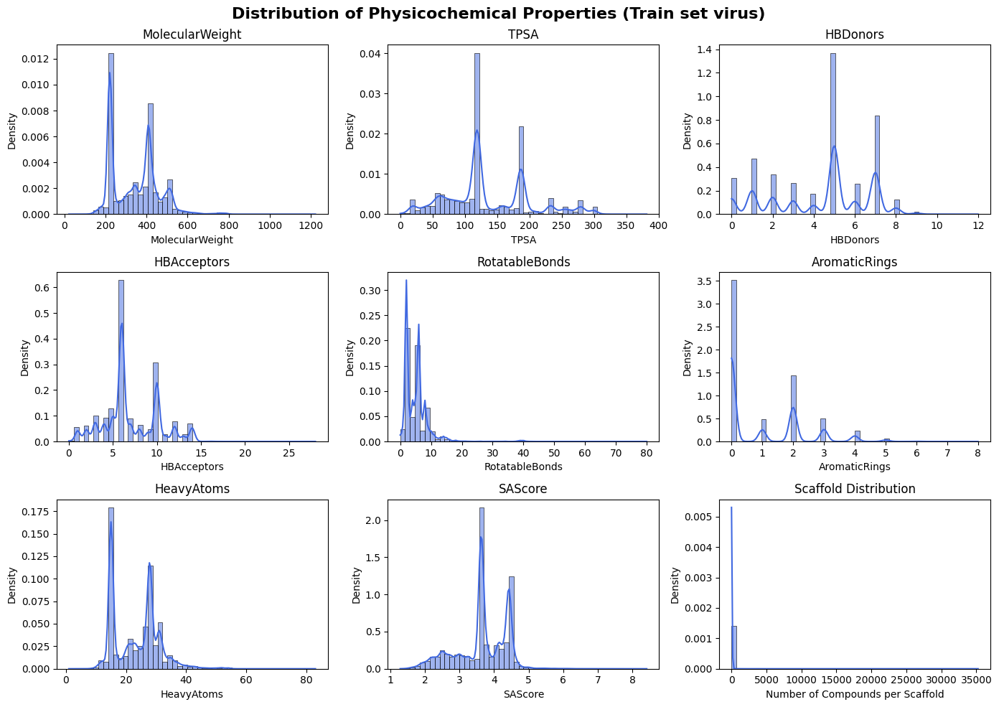

Synthetic Accessibility Score - Mean: 3.643, SD: 0.728
Analysis complete for: Train set virus


In [21]:
virus_properties_train = analyze_molecules(plindertrain_pfam, smiles_column="cleaned_smiles", valid_column=None, dataset_name="Train set virus", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/virus_trainset/')

## Test Dataset

In [22]:
plinder = pd.read_csv('/content/drive/MyDrive/Binder_Generation/plinder_pocket_data_only1_ligands.csv', sep=',', header='infer')
plinder_test = plinder[plinder['split'] == 'test']

In [23]:
plindertest_pfam = pd.merge(plinder_test, plinder_uniprot_pfam, on='pdb_id', how='left')
plindertest_pfam = plindertest_pfam.drop_duplicates(subset='ligand_id')
plindertest_pfam

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name
0,4tor,4tor__5__1.A_2.A__2.F__5.F,1,test,4tor__5__1.A_2.A__2.F,CCN(C(=O)C1CCN(S(=O)(=O)C2=CC3=C(C=CN3C(C)=O)C...,NaN,NaN,NaN,NaN,NaN
1,4tor,4tor__6__1.B_2.B__2.M__6.M,1,test,4tor__6__1.B_2.B__2.M,CCN(C(=O)C1CCN(S(=O)(=O)C2=CC3=C(C=CN3C(C)=O)C...,NaN,NaN,NaN,NaN,NaN
2,6bxa,6bxa__2__1.B__1.K__2.K,1,test,6bxa__2__1.B__1.K,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O,NaN,NaN,NaN,NaN,NaN
3,7f1x,7f1x__1__1.A__1.E__1.E,1,test,7f1x__1__1.A__1.E,O=P(O)(O)O[C@@H]1[C@H](O)[C@H](O)[C@@H](OP(=O)...,NaN,NaN,NaN,NaN,NaN
4,7f1x,7f1x__2__1.B__1.G__2.G,1,test,7f1x__2__1.B__1.G,O=P(O)(O)O[C@@H]1[C@H](O)[C@H](O)[C@@H](OP(=O)...,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
4738,5ib9,5ib9__1__1.A__1.B_1.C_1.H__1.H,1,test,5ib9__1__1.A__1.B_1.C_1.H,CC(C)C[C@H](NC(=O)[C@@H](O)[C@H](N)CC1=CC=CC=C...,NaN,NaN,NaN,NaN,NaN
4739,5ib9,5ib9__1__2.A__2.B_2.C_2.H__1.H,1,test,5ib9__1__2.A__2.B_2.C_2.H,CC(C)C[C@H](NC(=O)[C@@H](O)[C@H](N)CC1=CC=CC=C...,NaN,NaN,NaN,NaN,NaN
4740,4xpp,4xpp__1__2.A__2.B__1.B,1,test,4xpp__1__2.A__2.B,OC[C@H]1O[C@@H](O)[C@H](O)[C@@H](O)[C@H]1O,NaN,NaN,NaN,NaN,NaN
4741,3ug6,3ug6__1__1.C_1.D__1.M_1.N__1.M,1,test,3ug6__1__1.C_1.D__1.M_1.N,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@](=O)(O)O...,NaN,NaN,NaN,NaN,NaN


Starting analysis for: Train set virus


100%|██████████| 4743/4743 [00:12<00:00, 386.30it/s]


Molecular property computation complete!


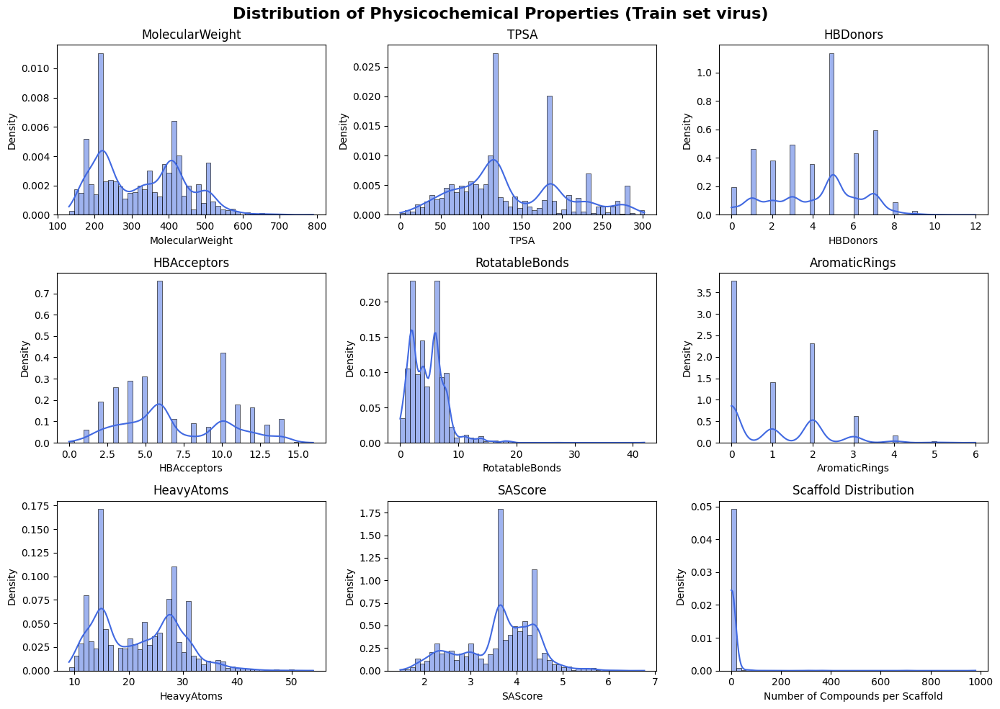

Synthetic Accessibility Score - Mean: 3.627, SD: 0.798
Analysis complete for: Train set virus


In [28]:
virus_properties_test = analyze_molecules(plindertest_pfam, smiles_column="cleaned_smiles", valid_column=None, dataset_name="Train set virus", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/virus_trainset/')

# Virus training set

Starting analysis for: Train set virus


100%|██████████| 50/50 [00:00<00:00, 391.07it/s]

Molecular property computation complete!


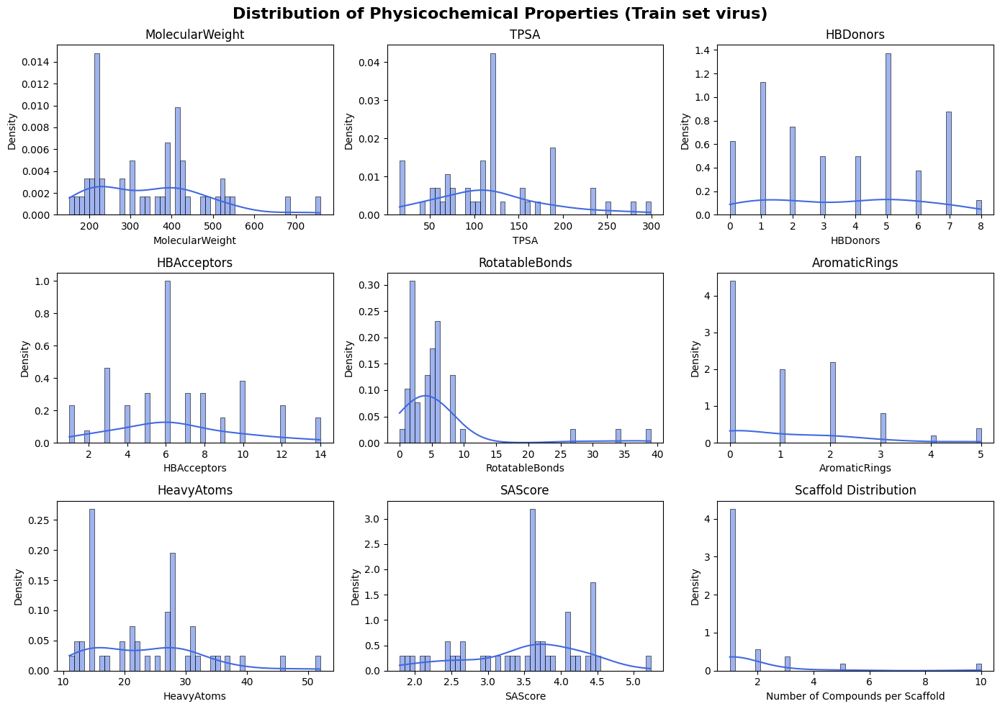

Synthetic Accessibility Score - Mean: 3.519, SD: 0.796
Analysis complete for: Train set virus


In [ ]:
# For generated_families_esm2_protonly (with validity column)
virus_properties = analyze_molecules(indomain_virus, smiles_column="cleaned_smiles", valid_column="valid", dataset_name="Train set virus", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/virus_trainset/')

# No virus training set

Starting analysis for: Train set no virus


100%|██████████| 50/50 [00:00<00:00, 203.89it/s]


Molecular property computation complete!


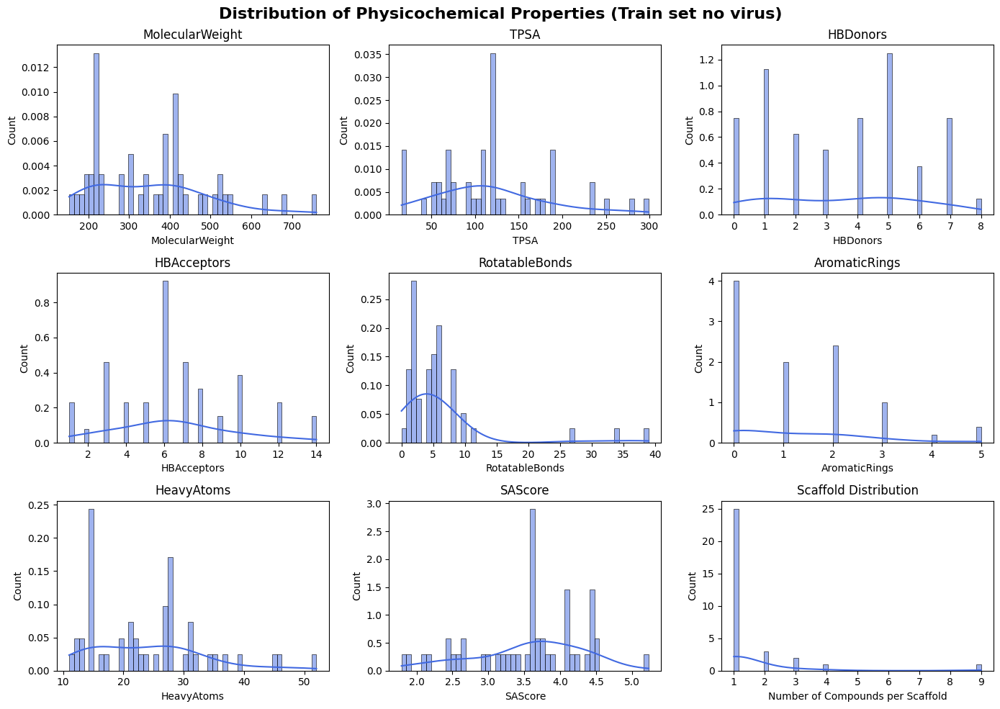

Synthetic Accessibility Score - Mean: 3.556, SD: 0.771
Analysis complete for: Train set no virus


In [ ]:
# For generated_families_esm2_protonly (with validity column)
virus_properties = analyze_molecules(indomain_novirus, smiles_column="cleaned_smiles", valid_column="valid", dataset_name="Train set no virus", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/trainset/')

# Test set (out-domain)

Starting analysis for: Test set, out-domain


100%|██████████| 50/50 [00:00<00:00, 390.06it/s]

Molecular property computation complete!


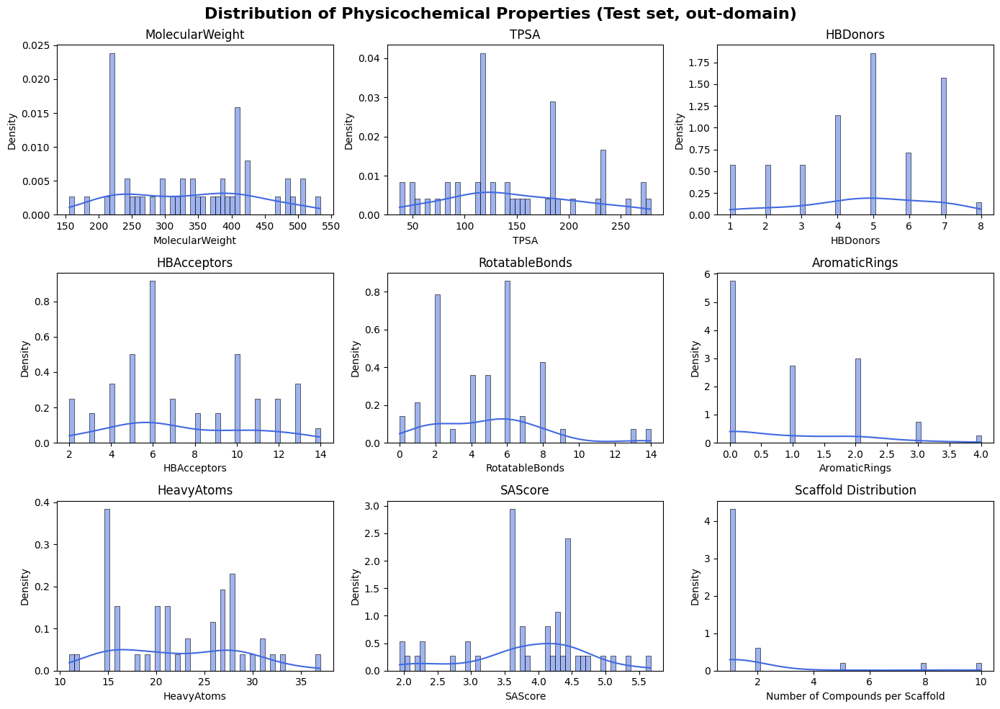

Synthetic Accessibility Score - Mean: 3.848, SD: 0.863
Analysis complete for: Test set, out-domain


In [96]:
outdomain_virus_properties = analyze_molecules(outdomain_virus, smiles_column="cleaned_smiles", valid_column=None, dataset_name="Test set, out-domain", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/trainset/')

# Generated Molecules

## ESM2 protein only

### Load Generated SMILES - Model: yes virus ESM-2 prot only

In [29]:
ESM2_prot_ep10_loss018 = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/generate_SMILES_trainedyesvirus_protpocket_ESM2_w_1_0_ep8_loss0.18_all.tsv', sep=',')
ESM2_prot_ep10_loss018

,protein_id,pocket_id,valid,smiles
0,1an0,1an0__1__1.A__1.C_1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
1,1an0,1an0__1__1.A__1.C_1.D,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
2,1an0,1an0__1__1.A__1.C_1.D,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
3,1an0,1an0__1__1.A__1.C_1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
4,1an0,1an0__1__1.A__1.C_1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
...,...,...,...,...
49995,4lys,4lys__1__1.A__1.B_1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49996,4lys,4lys__1__1.A__1.B_1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49997,4lys,4lys__1__1.A__1.B_1.D,0,CC(C)CC[C@@H](C)[C@H]1CC[C@H]2[C@@H]3CC=C5C[C@...
49998,4lys,4lys__1__1.A__1.B_1.D,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@@](=O)(O)...


In [30]:
# generated smiles with their corresponding family
generated_families_virus_esm2 = pd.merge(indomain_virus, ESM2_prot_ep10_loss018, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_virus_esm2

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,0,O=C1C=C(CNC(=O)C2=CC=C(C3=CC=CC=C3C=CC=C4)C=C2...
1,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(C=C(C)NC(=O)[C@H](CS(=O)(=O)O)C(C)C(=O)NC(C...
2,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,NC1=NC(=O)N([C@H]2C[C@H](O)[C@@H](COP(=O)(O)O)...
3,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
4,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,0,O=P(O)(O)OC[C@H]1O[C@@](O)([C@@H](O)[C@@H]1O
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49996,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49997,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,0,O=P(O)(O)OC1=CC=C(OP(=O)(=O)O)C=C1O
49998,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...


The generation has happened for 50 proteins


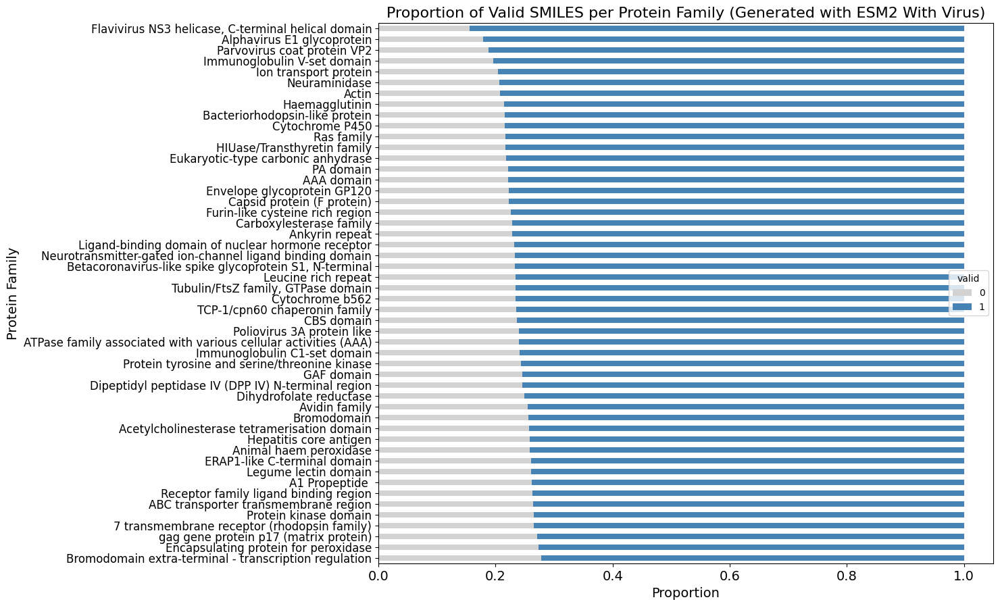

Validity Proportion - Mean: 0.765, SD: 0.025


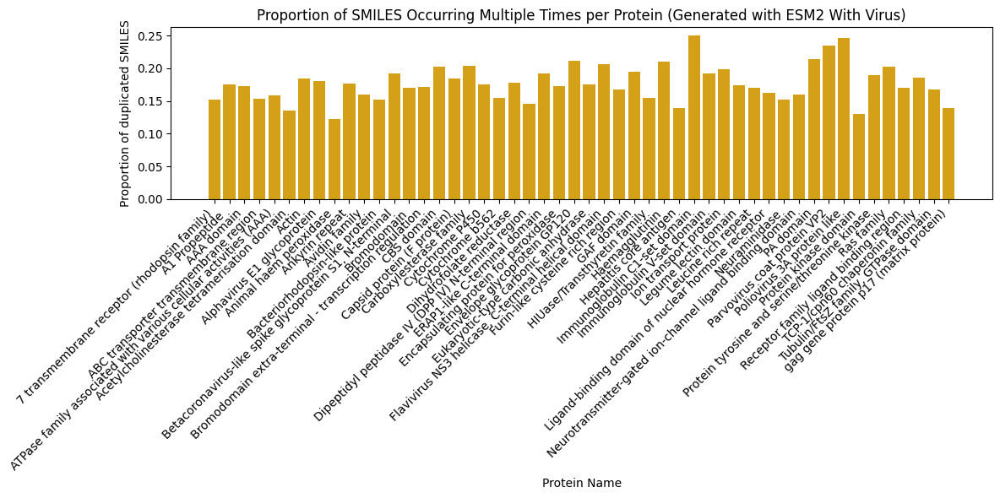

Duplicate Proportion - Mean: 0.177, SD: 0.028


In [31]:
valid_plot(generated_families_virus_esm2, "smiles", "valid", "Generated with ESM2 With Virus", True, '/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/' )

Starting analysis for: Generated with ESM2 With Virus


100%|██████████| 38265/38265 [00:51<00:00, 750.18it/s]
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-

Molecular property computation complete!


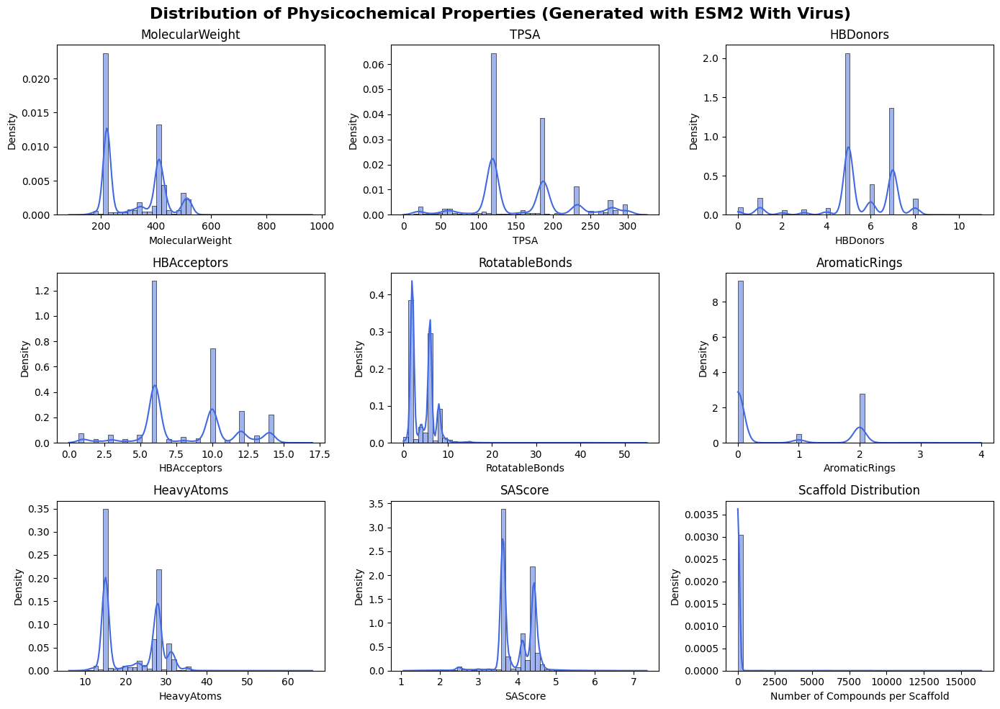

[15:51:34] Explicit valence for atom # 0 H, 3, is greater than permitted


Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/Generated_with_ESM2_With_Virus_scaffolds.png
Synthetic Accessibility Score - Mean: 3.967, SD: 0.501
Analysis complete for: Generated with ESM2 With Virus


In [32]:
# For generated_families_esm2_protonly (with validity column)
df_virus = analyze_molecules(generated_families_virus_esm2, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 With Virus", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/')

In [35]:
ESM2_virus_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/train_virus_toinfere.csv', sep=',')

Starting analysis for: Generated with ESM2 With Virus Tanimoto less than 1


100%|██████████| 3526/3526 [00:05<00:00, 625.54it/s]


Molecular property computation complete!


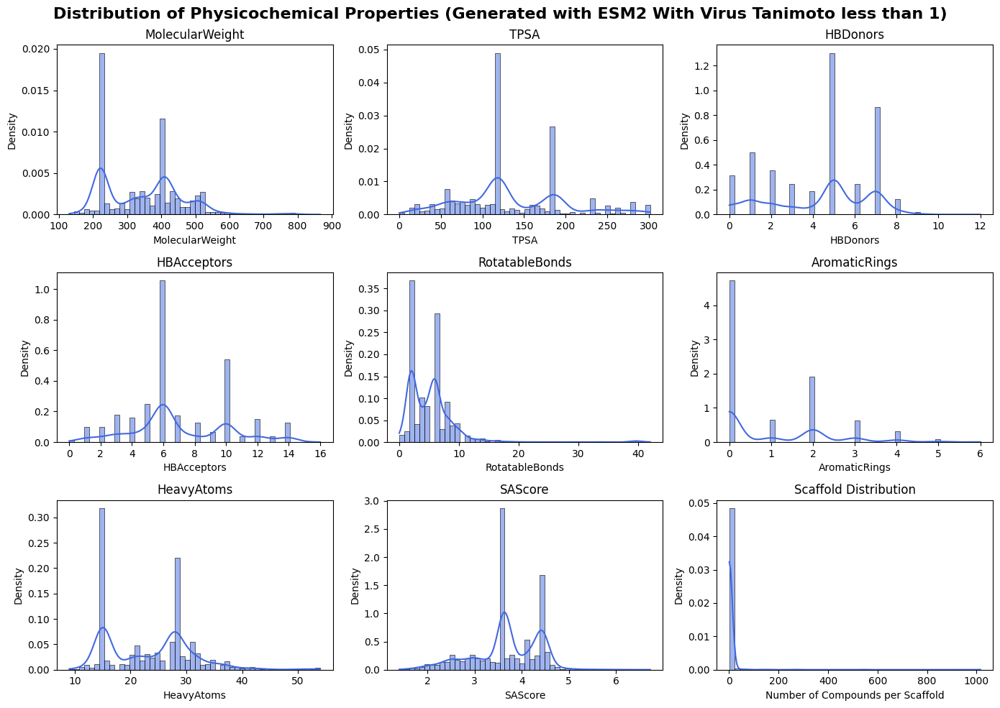

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/Generated_with_ESM2_With_Virus_Tanimoto_less_than_1_scaffolds.png
Synthetic Accessibility Score - Mean: 3.673, SD: 0.703
Analysis complete for: Generated with ESM2 With Virus Tanimoto less than 1


In [39]:
df_ESM2_virus_infere = analyze_molecules(ESM2_virus_toinfere, smiles_column="cleaned_smiles", valid_column=None, dataset_name="Generated with ESM2 With Virus Tanimoto less than 1", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/')

### Load Generated SMILES - Model: NO virus ESM-2 prot only

In [40]:
ESM2_prot_ep10_loss018_novirus = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/generate_SMILES_trainednovirus_protpocket_ESM2_w_1_0_ep10_loss018_all.csv', sep=',')
ESM2_prot_ep10_loss018_novirus

,protein_id,pocket_id,valid,smiles
0,2g0h,2g0h__1__1.A__1.C,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
1,2g0h,2g0h__1__1.A__1.C,0,COC1=CC=C(CN(C)C(C)C2=NC(N4=CC=CC=C3NCCC3)=C2)...
2,2g0h,2g0h__1__1.A__1.C,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
3,2g0h,2g0h__1__1.A__1.C,0,CNC1=NC2=CC=CC=NC2=CN=C1N1
4,2g0h,2g0h__1__1.A__1.C,0,COC1=CC=C(C2=CC=C(C3=NN4C(C(=O)O)=C3)=C3)=NN2C...
...,...,...,...,...
49995,9ayf,9ayf__1__1.A__1.M,0,O=C1NC2=CC=C(C3=CC=C4C=CNC(=O)N2)=CC=C1
49996,9ayf,9ayf__1__1.A__1.M,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49997,9ayf,9ayf__1__1.A__1.M,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49998,9ayf,9ayf__1__1.A__1.M,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O


In [41]:
# generated smiles with their corresponding family
generated_families_novirus_esm2 = pd.merge(indomain_novirus, ESM2_prot_ep10_loss018_novirus, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_novirus_esm2

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
1,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](COP(=O)(O)O)[C...
2,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(C)CCC[C@@H](C)[C@H]1CC[C@H]2[C@@H]3CC=C4C[C...
3,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,0,CCOC1=CC=C(C(=O)N=C3N(CCCCC3=CC(CCC(C)CC3)C=C2...
4,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@](=O)(O)O...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,3fnu,3fnu__2__1.C__1.G__2.G,1,train,3fnu__2__1.C__1.G,CC1=CC=CC(C)=C1OCC(=O)N[C@@H](CC1=CC=CC=C1)[C@...,Q8IM15,PF00026,PF00026,Peptidase_AA,Eukaryotic aspartyl protease,3fnu,3fnu__2__1.C__1.G,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49996,3fnu,3fnu__2__1.C__1.G__2.G,1,train,3fnu__2__1.C__1.G,CC1=CC=CC(C)=C1OCC(=O)N[C@@H](CC1=CC=CC=C1)[C@...,Q8IM15,PF00026,PF00026,Peptidase_AA,Eukaryotic aspartyl protease,3fnu,3fnu__2__1.C__1.G,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49997,3fnu,3fnu__2__1.C__1.G__2.G,1,train,3fnu__2__1.C__1.G,CC1=CC=CC(C)=C1OCC(=O)N[C@@H](CC1=CC=CC=C1)[C@...,Q8IM15,PF00026,PF00026,Peptidase_AA,Eukaryotic aspartyl protease,3fnu,3fnu__2__1.C__1.G,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49998,3fnu,3fnu__2__1.C__1.G__2.G,1,train,3fnu__2__1.C__1.G,CC1=CC=CC(C)=C1OCC(=O)N[C@@H](CC1=CC=CC=C1)[C@...,Q8IM15,PF00026,PF00026,Peptidase_AA,Eukaryotic aspartyl protease,3fnu,3fnu__2__1.C__1.G,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O


The generation has happened for 50 proteins


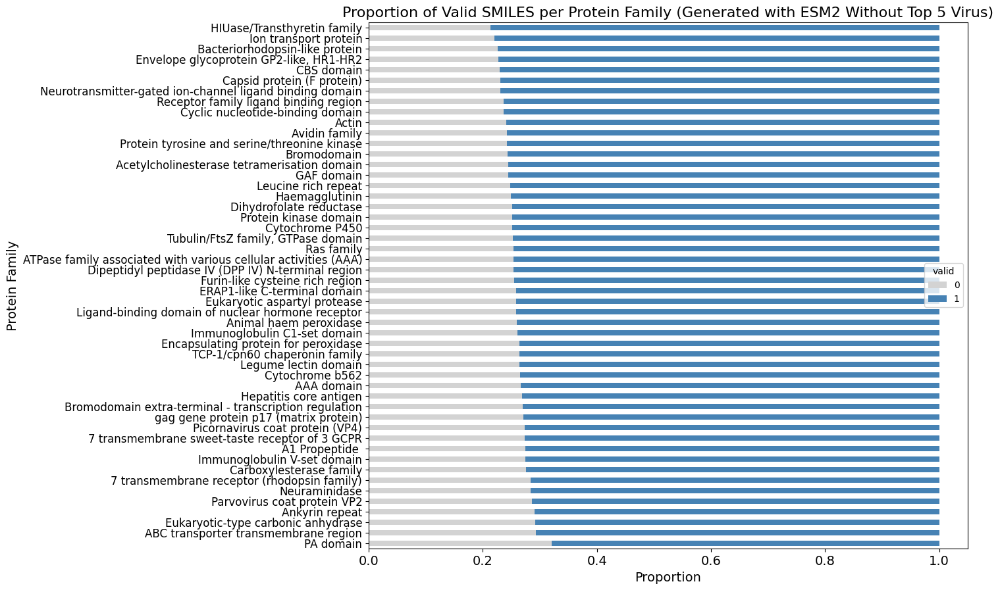

Validity Proportion - Mean: 0.742, SD: 0.021


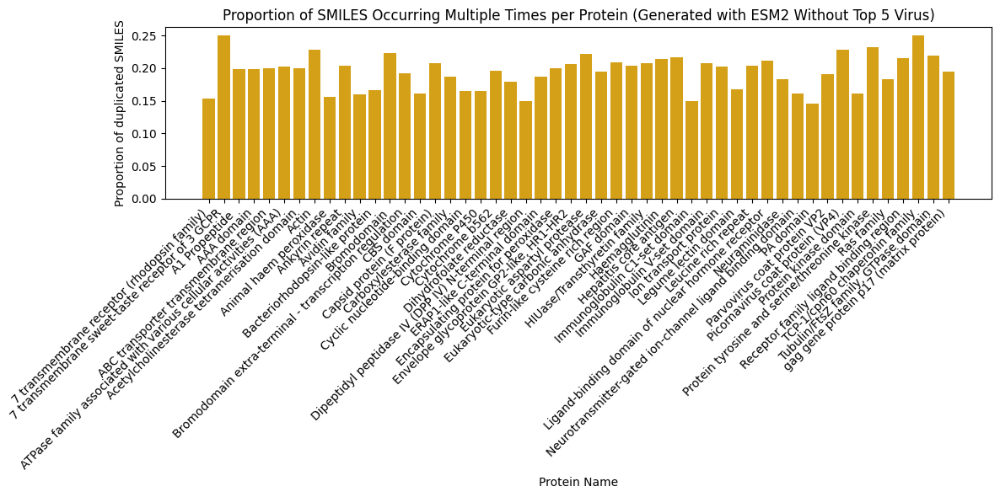

Duplicate Proportion - Mean: 0.194, SD: 0.026


In [42]:
valid_plot(generated_families_novirus_esm2, "smiles", "valid", "Generated with ESM2 Without Top 5 Virus", True, '/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/' )

Starting analysis for: Generated with ESM2 Without Top 5 Virus


100%|██████████| 37114/37114 [00:53<00:00, 697.68it/s]
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-

Molecular property computation complete!


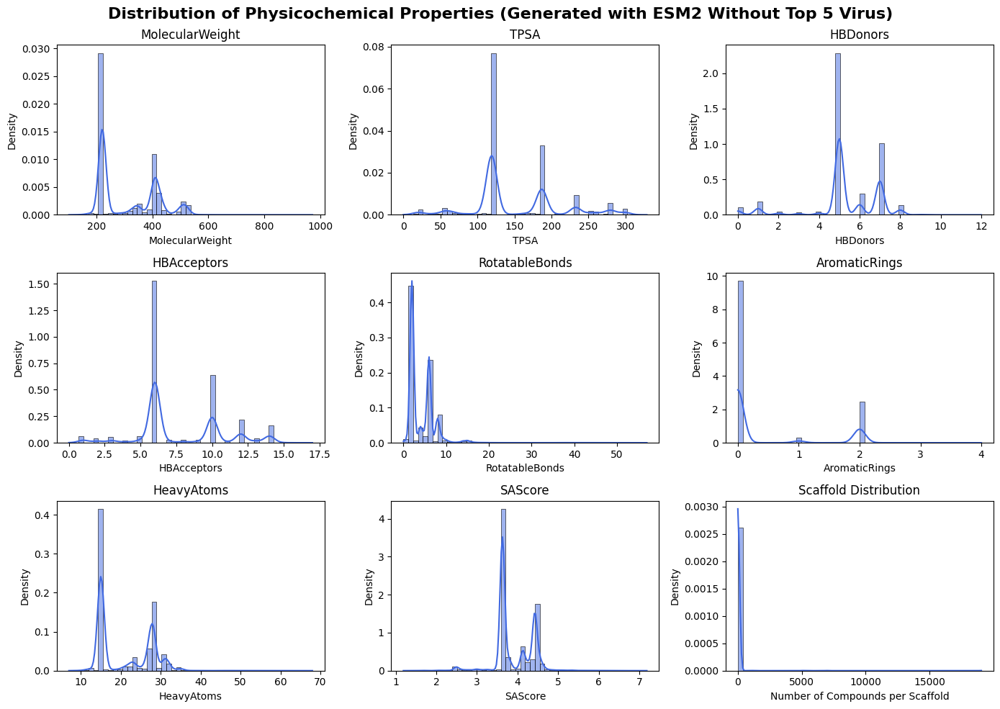

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/Generated_with_ESM2_Without_Top_5_Virus_scaffolds.png
Synthetic Accessibility Score - Mean: 3.903, SD: 0.477
Analysis complete for: Generated with ESM2 Without Top 5 Virus


In [43]:
# For generated_families_esm2_protonly (with validity column)
df_novirus = analyze_molecules(generated_families_novirus_esm2, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 Without Top 5 Virus", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/')

In [44]:
ESM2_novirus_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/train_novirus_toinfere.csv', sep=',')

Starting analysis for: Generated with ESM2 Without Top 5 Virus Tanimoto less than 1


100%|██████████| 3526/3526 [00:05<00:00, 594.02it/s]


Molecular property computation complete!


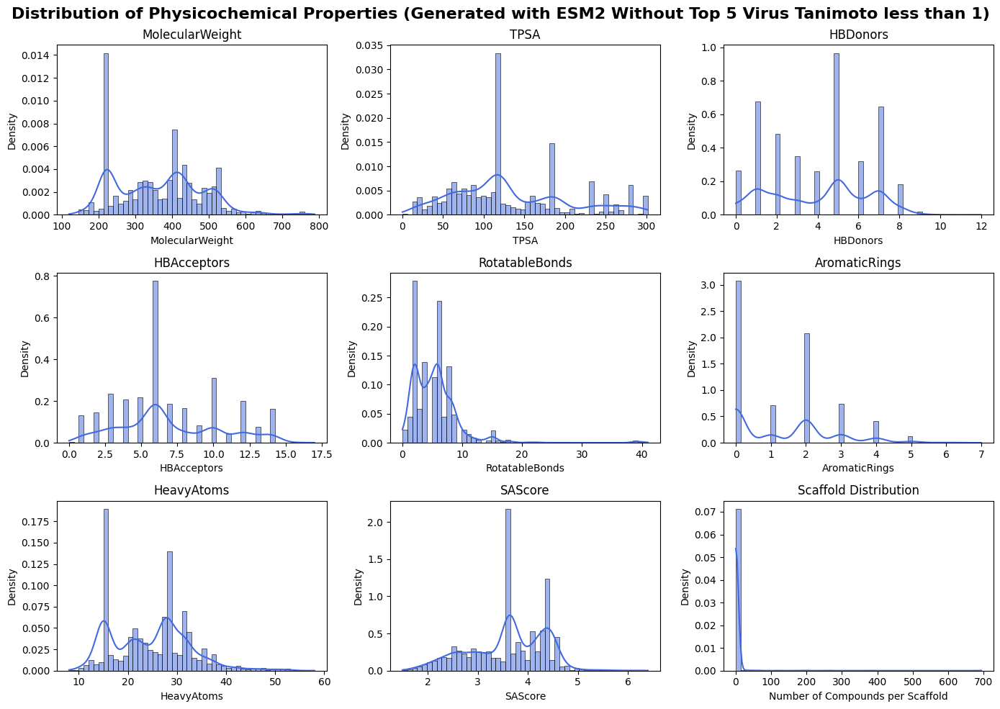

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/Generated_with_ESM2_Without_Top_5_Virus_Tanimoto_less_than_1_scaffolds.png
Synthetic Accessibility Score - Mean: 3.598, SD: 0.759
Analysis complete for: Generated with ESM2 Without Top 5 Virus Tanimoto less than 1


In [47]:
df_ESM2_novirus_infere = analyze_molecules(ESM2_novirus_toinfere, smiles_column="cleaned_smiles", valid_column=None, dataset_name="Generated with ESM2 Without Top 5 Virus Tanimoto less than 1", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/')

### Properties Comparison

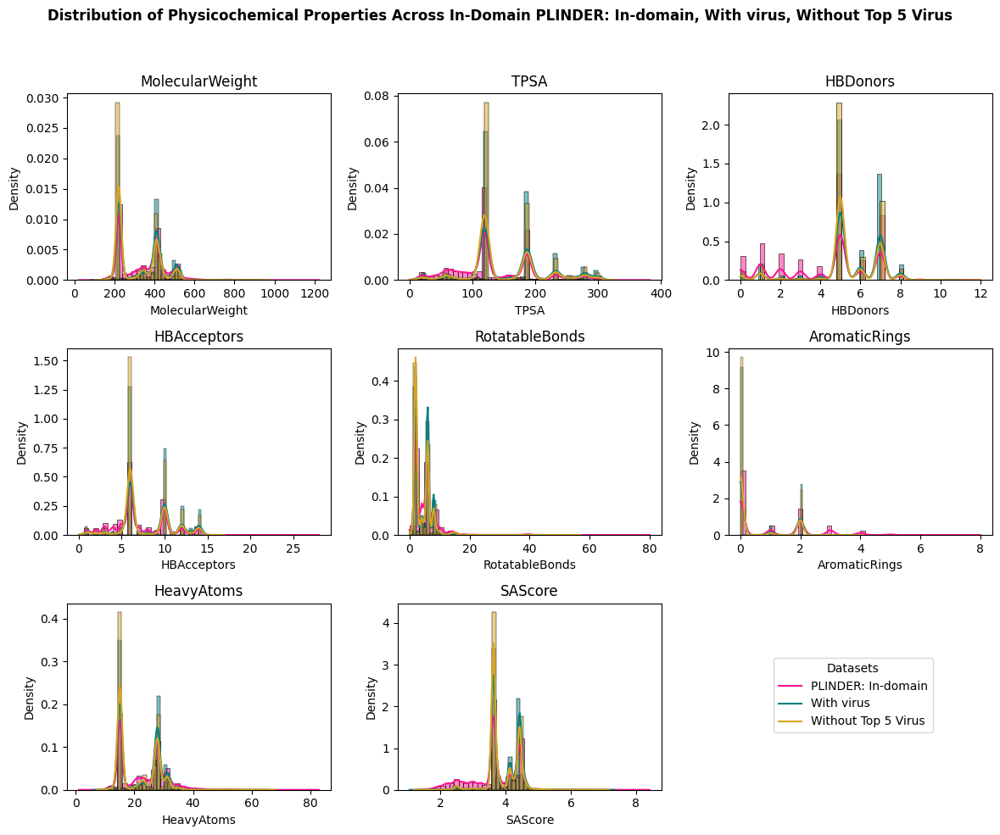

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: In-domain": virus_properties_train,
    "With virus": df_virus,
    "Without Top 5 Virus": df_novirus,
}
plinder_color = '#FF1493'
colors = [plinder_color, "#008080", "#DAA520"]#,  "yellow"]  # Colors for datasets, "green"

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
fig.suptitle(
    f"Distribution of Physicochemical Properties Across In-Domain {', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)
# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"virus_no_virus_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

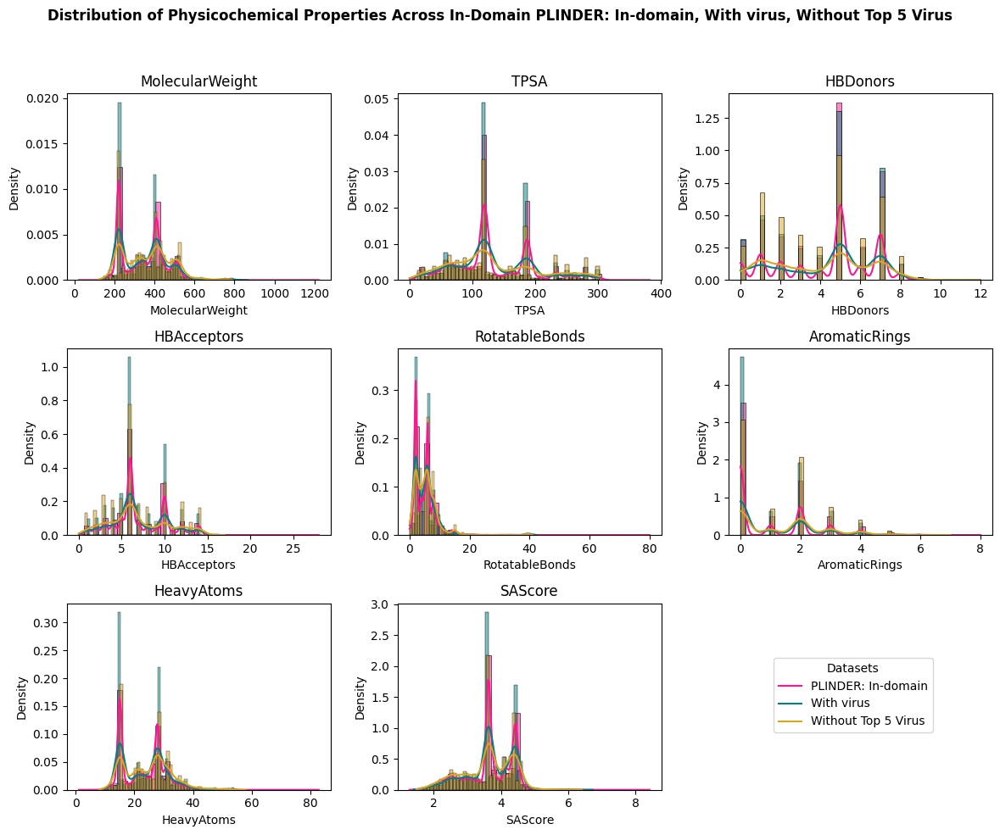

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: In-domain": virus_properties_train,
    "With virus": df_ESM2_virus_infere,
    "Without Top 5 Virus": df_ESM2_novirus_infere,
}
plinder_color = '#FF1493'
colors = [plinder_color, "#008080", "#DAA520"]#,  "yellow"]  # Colors for datasets, "green"

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
fig.suptitle(
    f"Distribution of Physicochemical Properties Across In-Domain {', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)
# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"infere_virus_no_virus_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

# In-Domain with virus

## ESM2 + PickPocket

In [50]:
ESM2_pocket = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/generate_SMILES_trainedyesvirus_protpocket_ESM2_concat_ep7_loss0.17_all.tsv', sep=',')
ESM2_pocket

,protein_id,pocket_id,valid,smiles
0,8gz2,8gz2__1__1.A__1.I,0,CCON=CC1=CC=C(OCC[C@@H]2CCN(C3=CC=NC=C3)C2=C1
1,8gz2,8gz2__1__1.A__1.I,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
2,8gz2,8gz2__1__1.A__1.I,0,CC(C)CCC[N+](=O)(=O)[C@@H]1CCN(CC1=CC=CC=C1)N2
3,8gz2,8gz2__1__1.A__1.I,0,O=S(=O)(O)C[C@H]1CNC(=O)C1=CC=CC=C12
4,8gz2,8gz2__1__1.A__1.I,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
...,...,...,...,...
49995,5cav,5cav__1__1.A__1.B,1,C[C@@H]1[C@H](O[C@@H]2[C@@H](O)[C@@H](O)[C@@H]...
49996,5cav,5cav__1__1.A__1.B,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49997,5cav,5cav__1__1.A__1.B,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49998,5cav,5cav__1__1.A__1.B,1,NC1=NC=NC2=C1N=CN2[C@H]1C[C@H](O)[C@@H](COP(=O...


In [51]:
# generated smiles with their corresponding family
generated_families_ESM2_pocket = pd.merge(indomain_virus, ESM2_pocket, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_ESM2_pocket

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,0,CN(C)C(C)C(=O)NC(=O)C1=CC(S(=O)(=O)C(C)C(C)(F)...
1,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(C=CC=C(C)C=CC1=C(C)CCCC1(C)C)=CC=O
2,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
3,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
4,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,NC1=NC(=O)N([C@H]2C[C@H](O)[C@@H](COP(=O)(O)O)...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49996,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,0,O=C(N[C@@@H](NS(=O)C1=CC=CC=C1)O1)CCN(CC1=CC=C...
49997,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49998,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CCCCCCCCCCCCC[N+](C)(C)CCS(=O)(=O)O


The generation has happened for 50 proteins


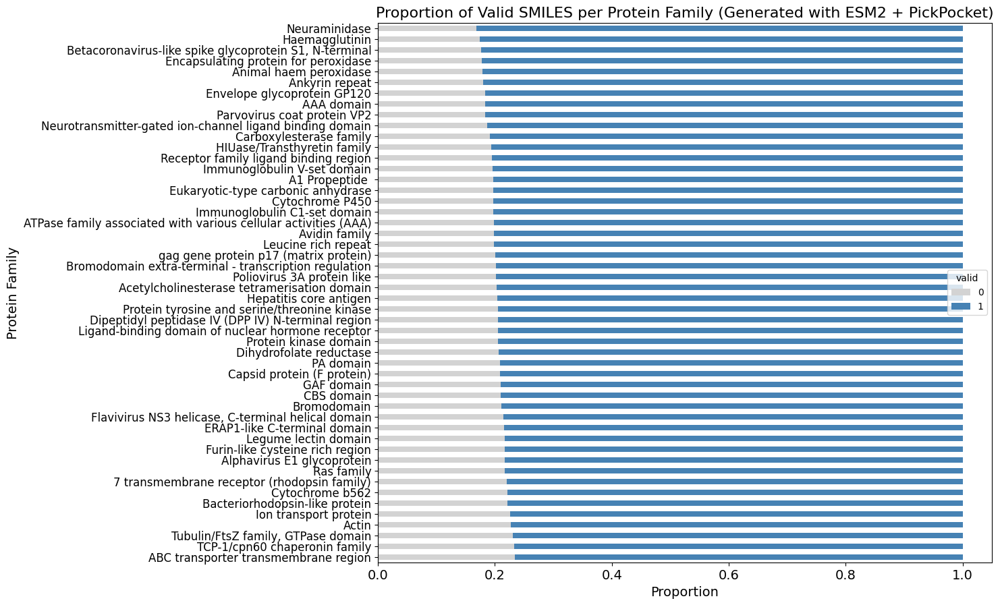

Validity Proportion - Mean: 0.797, SD: 0.016


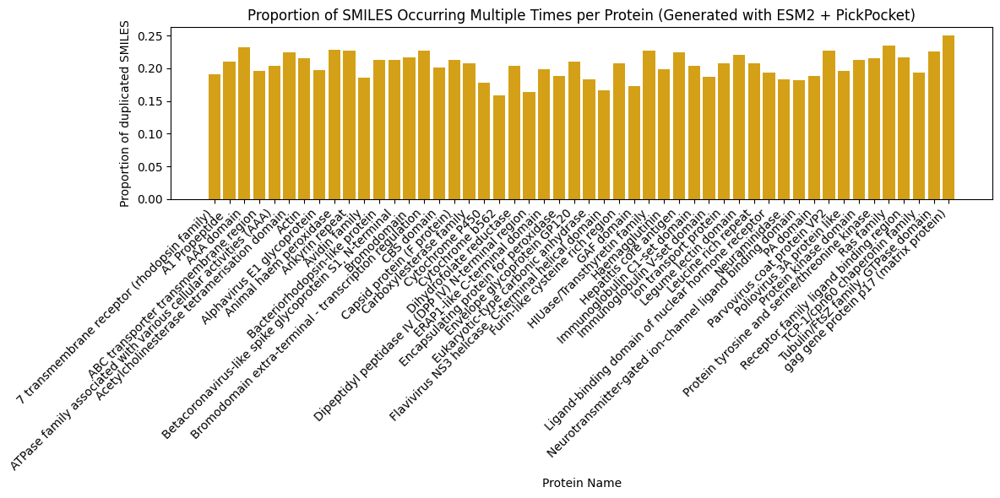

Duplicate Proportion - Mean: 0.204, SD: 0.020


In [52]:
valid_plot(generated_families_ESM2_pocket, "smiles", "valid", "Generated with ESM2 + PickPocket", True, '/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/' )

Starting analysis for: Generated with ESM2 + PickPocket


100%|██████████| 39846/39846 [00:54<00:00, 735.31it/s]
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-

Molecular property computation complete!


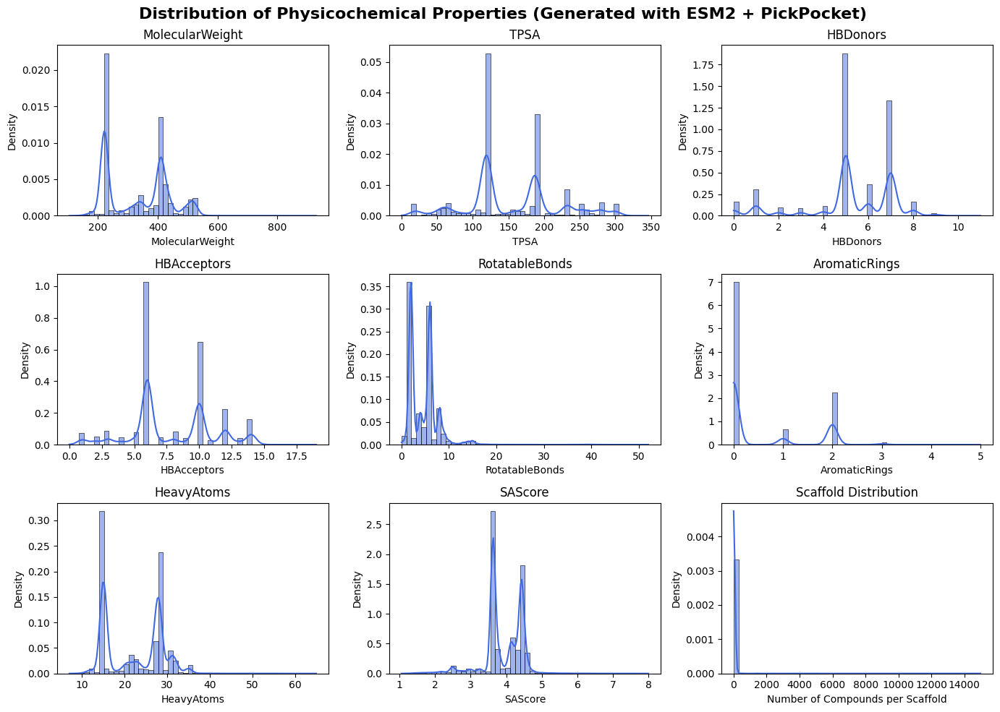

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/Generated_with_ESM2_+_PickPocket_scaffolds.png
Synthetic Accessibility Score - Mean: 3.913, SD: 0.559
Analysis complete for: Generated with ESM2 + PickPocket


In [53]:
# For generated_families_esm2_protonly (with validity column)
df_ESM2_pocket = analyze_molecules(generated_families_ESM2_pocket, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 + PickPocket", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/')

In [54]:
ESM2_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/ESM2pocket_virus_toinfere_id.csv', sep=',')
# generated smiles with their corresponding family
generated_families_ESM2_pocket_infere = pd.merge(indomain_virus, ESM2_pocket_toinfere, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_ESM2_pocket_infere

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles,drug_id
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,O=C1C=CN([C@@H]2O[C@H](CO[P@](=O)(O)OP(=O)(O)O...,6i0w_94
1,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CCCCCCCCCC[C@H](C)[C@H](C)[C@H](O)CO,6i0w_95
2,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CCOC(=O)C1=CC=C(OCC)C(CC)=C1[C@@](C)(C)CC,6i0w_96
3,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,O=C1C=CN([C@@H]2O[C@H](CO[P@@](=O)(O)O[P@@](=O...,6i0w_97
4,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CCCCCCCCCCCCCCCCCCC(=O)OCCOC[N+](C)(C)OC,6i0w_98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4499,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,O=C1NC(N)=C([C@H]2C[C@H](O)[C@@H](COP(=O)(O)O)...,8sar_4235
4500,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CCCCCCCCCCC[N+](C)(C)CCCCS(=O)(=O)O,8sar_4236
4501,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,N[C@@H](CCCC(=O)N[C@@H](COP(=O)(O)O)[C@H](O)CO...,8sar_4237
4502,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,C[C@@H](O)[C@@H](C=O)NC(=O)[C@H](CO)NC(=O)[C@H...,8sar_4238


Starting analysis for: Generated with ESM2 + PickPocket


100%|██████████| 4504/4504 [00:06<00:00, 712.42it/s]


Molecular property computation complete!


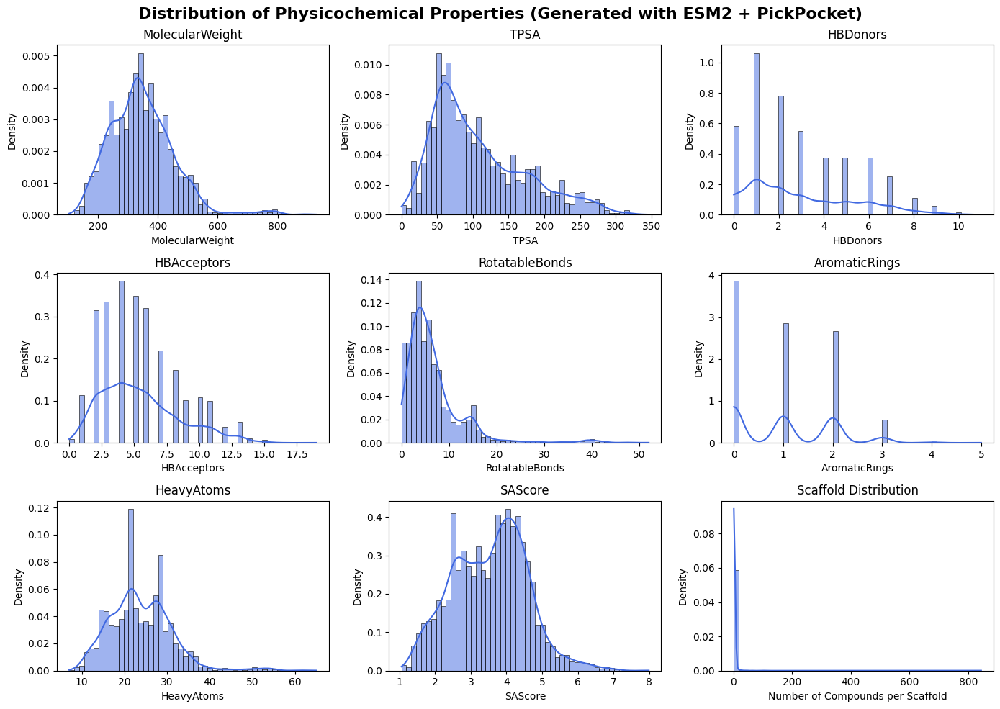

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/Generated_with_ESM2_+_PickPocket_scaffolds.png
Synthetic Accessibility Score - Mean: 3.538, SD: 1.037
Analysis complete for: Generated with ESM2 + PickPocket


In [55]:
df_ESM2_pocket_infere = analyze_molecules(generated_families_ESM2_pocket_infere, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 + PickPocket", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/')

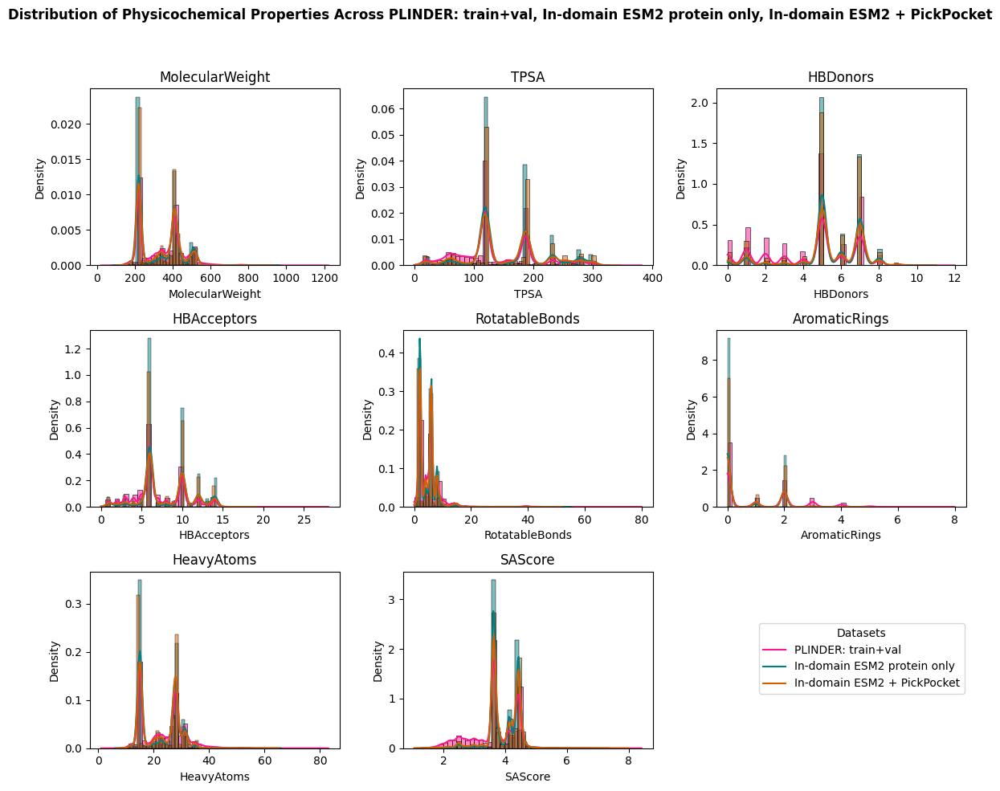

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: train+val": virus_properties_train,
    "In-domain ESM2 protein only": df_virus,
    "In-domain ESM2 + PickPocket": df_ESM2_pocket,
}
plinder_color = '#FF1493'
colors = [ plinder_color, "#008080", "#D55E00"]#,  "yellow"]  # Colors for datasets, "green"

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"pocket_no_pocket_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

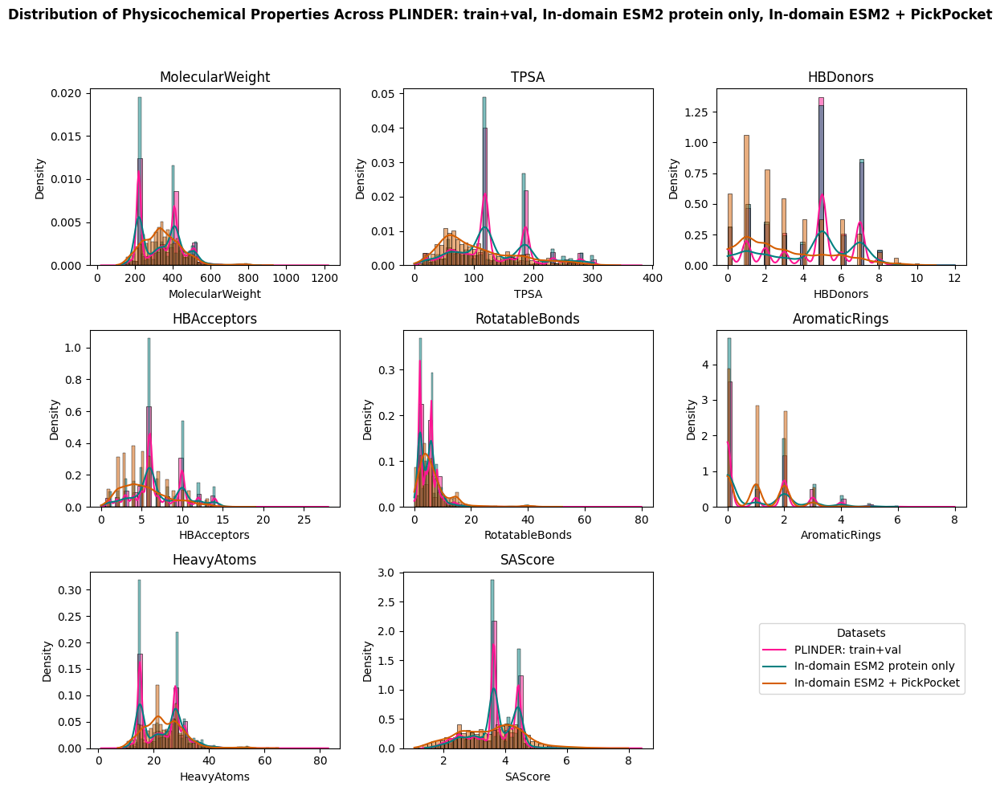

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: train+val": virus_properties_train,
    "In-domain ESM2 protein only": df_ESM2_virus_infere,
    "In-domain ESM2 + PickPocket": df_ESM2_pocket_infere,
}
plinder_color = '#FF1493'
colors = [ plinder_color, "#008080", "#D55E00"]#,  "yellow"]  # Colors for datasets, "green"

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"pocket_no_pocket_physicochemical_distributions_inferte.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

## SaProt + PickPocket

In [60]:
SaProt_pocket = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/generate_SMILES_trainedyesvirus_protpocket_SaProt_concat_ep7_loss0.15_all.tsv', sep=',')
SaProt_pocket

,protein_id,pocket_id,valid,smiles
0,7bua,7bua__5__2.B__2.N,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
1,7bua,7bua__5__2.B__2.N,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@](=O)(O)O...
2,7bua,7bua__5__2.B__2.N,0,CCC1=NC2=C(C=C1OC)C1=CC=CN([C@@H]2O[C@@H]3O[C@...
3,7bua,7bua__5__2.B__2.N,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
4,7bua,7bua__5__2.B__2.N,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
...,...,...,...,...
49995,6nk7,6nk7__1__37.Q__37.V,0,CCCNCC1=CC=C(OCC2=NC=C2N=C3C(=O)NC3=CC=C(Cl)C=...
49996,6nk7,6nk7__1__37.Q__37.V,0,CC1=CC=NC2=C1N=C(NC(=O)NCC1=O)NC(=O)NC2=NC(NC3...
49997,6nk7,6nk7__1__37.Q__37.V,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49998,6nk7,6nk7__1__37.Q__37.V,0,CC1=NC2=C(C=C1C)=C(NC1=CC=CC(C(F)(F)F)=CC(NCCC...


In [61]:
# generated smiles with their corresponding family
generated_families_SaProt_pocket = pd.merge(indomain_virus, SaProt_pocket, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_SaProt_pocket

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CCCCCCCCCCCC[N+](C)(C)CCS(=O)(=O)O
1,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,0,C[C@@H](O)[C@@H](C=O)[C@H](O)[C@H]1O
2,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](COP(=O)(O)O)[C...
3,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@@](=O)(O)...
4,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC1=NOC(CCCCCCOC2=CC=C(C3=N[C@@H](C)CO3)C=C2)=C1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49996,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49997,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49998,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,0,N[C@@H](CC1=CC=CNC2=[N+]=CC=C1)[C@@H](O)C(=O)O


Starting analysis for: Generated with SaProt + PickPocket


100%|██████████| 39789/39789 [00:52<00:00, 754.59it/s]
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-

Molecular property computation complete!


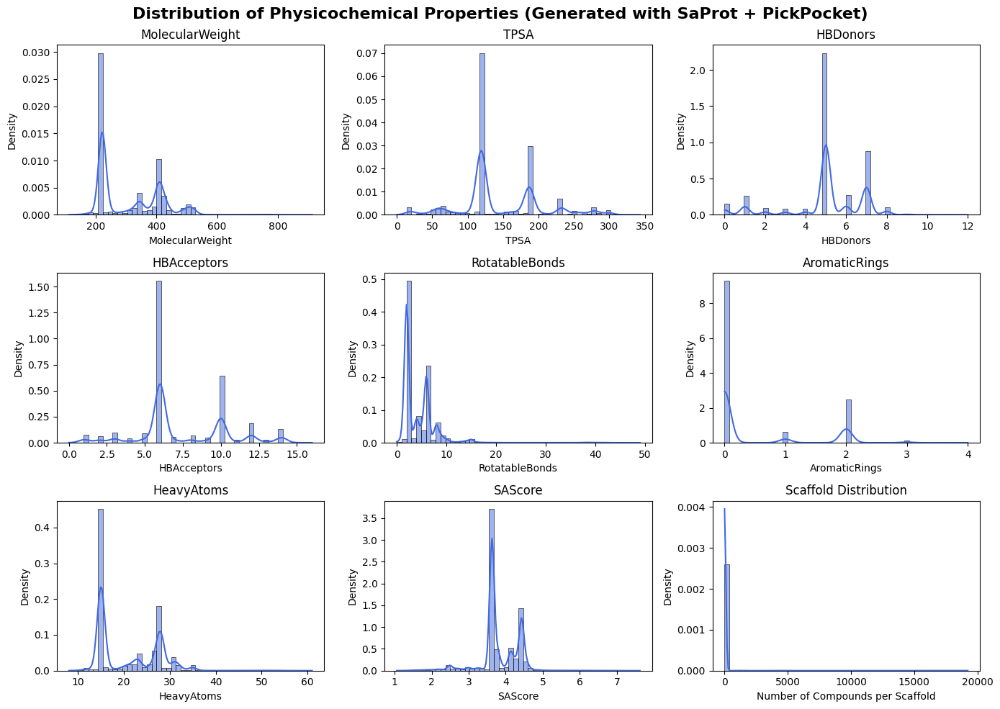

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/Generated_with_SaProt_+_PickPocket_scaffolds.png
Synthetic Accessibility Score - Mean: 3.819, SD: 0.538
Analysis complete for: Generated with SaProt + PickPocket


In [62]:
# For generated_families_esm2_protonly (with validity column)
df_SaProt_pocket = analyze_molecules(generated_families_SaProt_pocket, smiles_column="smiles", valid_column="valid", dataset_name="Generated with SaProt + PickPocket", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/')

The generation has happened for 50 proteins


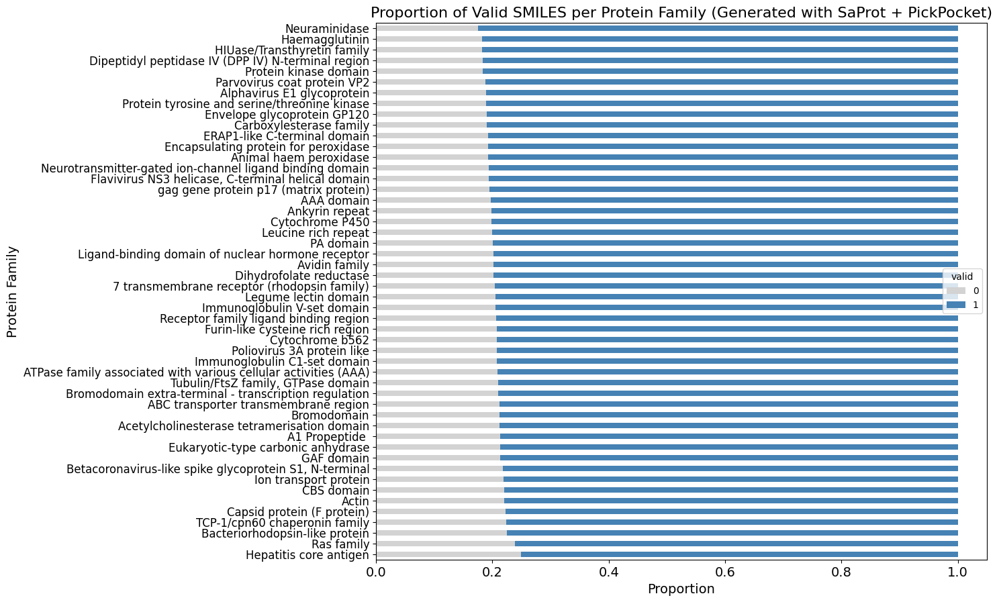

Validity Proportion - Mean: 0.796, SD: 0.015


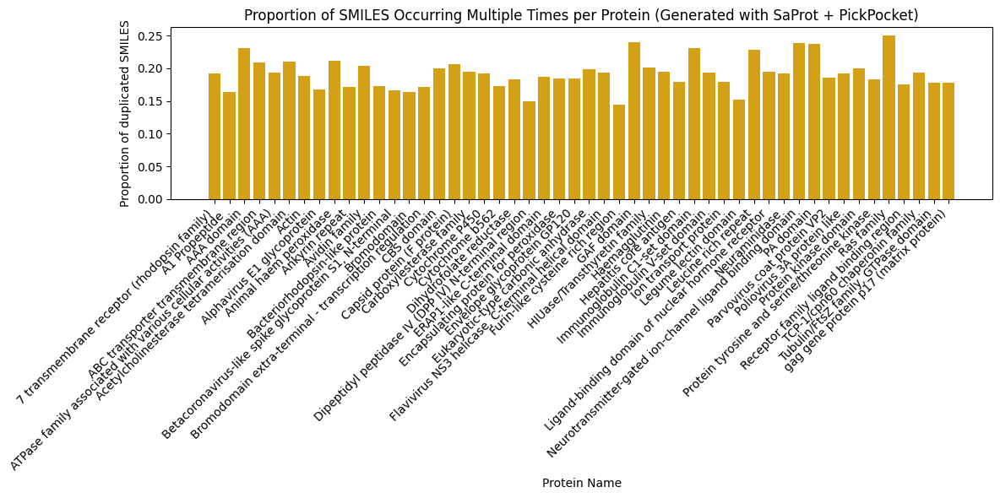

Duplicate Proportion - Mean: 0.192, SD: 0.024


In [63]:
valid_plot(generated_families_SaProt_pocket, "smiles", "valid", "Generated with SaProt + PickPocket", True, '/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/' )

In [64]:
SaProt_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/SaProtpocket_virus_toinfere_id.csv', sep=',')
# generated smiles with their corresponding family
generated_families_SaProt_pocket_infere = pd.merge(indomain_virus, SaProt_pocket_toinfere, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_SaProt_pocket_infere

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles,drug_id
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CCCCCCCCCCCC[N+](C)(C)CCS(=O)(=O)O,6i0w_1592
1,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC1=CC(CC(=O)N[C@H](C2=CC=CC=C2)C(=O)NC2=CC=NC...,6i0w_1593
2,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,C[C@@H](O)[C@@H](C=O)NC(=O)[C@H](CO)NC(=O)[C@@...,6i0w_1594
3,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,O=C1C=CS([C@@H]2O[C@H](CO[P@@](=O)(O)O)O2)C(=O)N1,6i0w_1595
4,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC1=NOC(CCCCOC2=C(C)C=C(C3=NOC(C(F)(F)F)=N3)C=...,6i0w_1596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4175,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,O=C(O)C1=C(CC(=O)NC2=CC=CC=C2)C=C1,8sar_1343
4176,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CN(CCCC1=CN=CC=C1)C(=O)C1=CC=C(Cl)C=C1,8sar_1344
4177,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,O=C1NC2=CC=CC=C2[N++](CC3=CNC=CC=C32)C2=C1,8sar_1345
4178,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CCCCCCCCCCCC(=O)OC[C@](COC(=O)CC1=CC=C(OC)C=C1...,8sar_1346


Starting analysis for: Generated with SaProt + PickPocket


100%|██████████| 4180/4180 [00:06<00:00, 603.31it/s]


Molecular property computation complete!


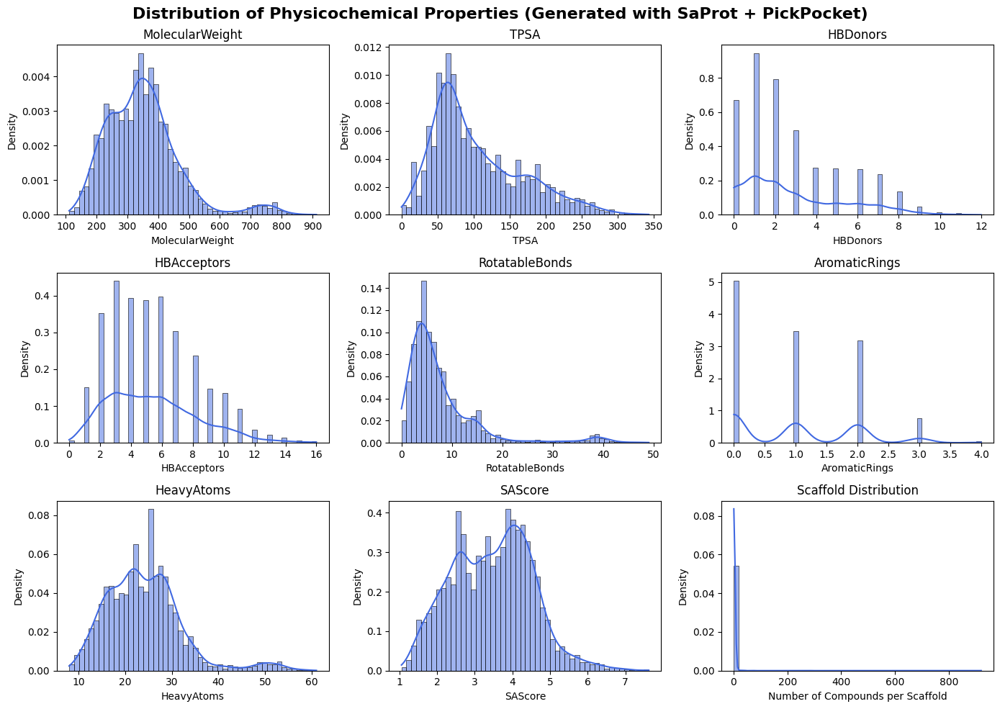

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/Generated_with_SaProt_+_PickPocket_scaffolds.png
Synthetic Accessibility Score - Mean: 3.458, SD: 1.060
Analysis complete for: Generated with SaProt + PickPocket


In [65]:
df_SaProt_pocket_infere = analyze_molecules(generated_families_SaProt_pocket_infere, smiles_column="smiles", valid_column="valid", dataset_name="Generated with SaProt + PickPocket", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/')

## TensorDTI + PickPocket

In [66]:
Tensor_pocket = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/generate_SMILES_trainedyesvirus_TensorDTI_protpocket_concat_ep6_loss0.16_all.tsv', sep=',')
Tensor_pocket

,protein_id,pocket_id,valid,smiles
0,4lys,4lys__1__1.A__1.B_1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
1,4lys,4lys__1__1.A__1.B_1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
2,4lys,4lys__1__1.A__1.B_1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
3,4lys,4lys__1__1.A__1.B_1.D,1,NC1=NC=NC2=C1N=CN2[C@H]1C[C@H](O)[C@@H](CO[P@]...
4,4lys,4lys__1__1.A__1.B_1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
...,...,...,...,...
49995,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49996,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49997,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49998,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...


In [67]:
# generated smiles with their corresponding family
generated_families_Tensor_pocket = pd.merge(indomain_virus, Tensor_pocket, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_Tensor_pocket

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,O=C1C=CN([C@H]2C[C@H](O)[C@@H](COP(=O)(O)O)O2)...
1,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@](=O)(O)O...
2,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
3,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,0,NC1=NC(=O)[C@@H]2O[C@H](COP(=O)(O)O)[C@@H](O)[...
4,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49996,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49997,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49998,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...


Starting analysis for: Generated with TensorDTI Prot + Pocket


100%|██████████| 39533/39533 [00:53<00:00, 742.80it/s]
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-

Molecular property computation complete!


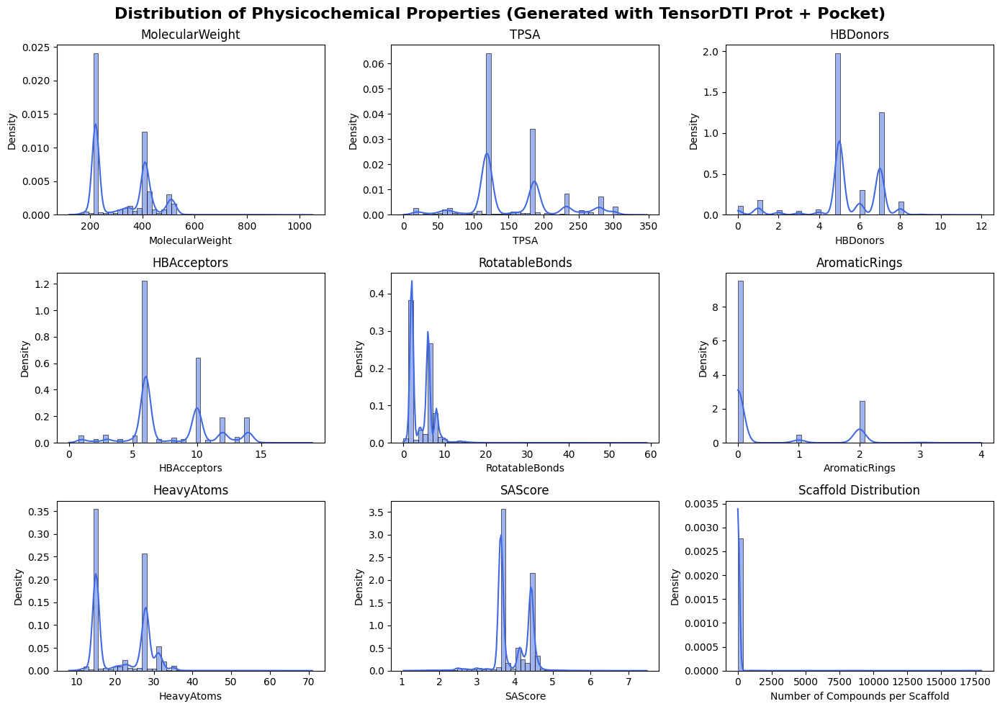

[16:41:52] Explicit valence for atom # 0 H, 3, is greater than permitted


Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/Generated_with_TensorDTI_Prot_+_Pocket_scaffolds.png
Synthetic Accessibility Score - Mean: 3.937, SD: 0.497
Analysis complete for: Generated with TensorDTI Prot + Pocket


In [68]:
# For generated_families_esm2_protonly (with validity column)
df_Tensor_pocket = analyze_molecules(generated_families_Tensor_pocket, smiles_column="smiles", valid_column="valid", dataset_name="Generated with TensorDTI Prot + Pocket", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/')

The generation has happened for 50 proteins


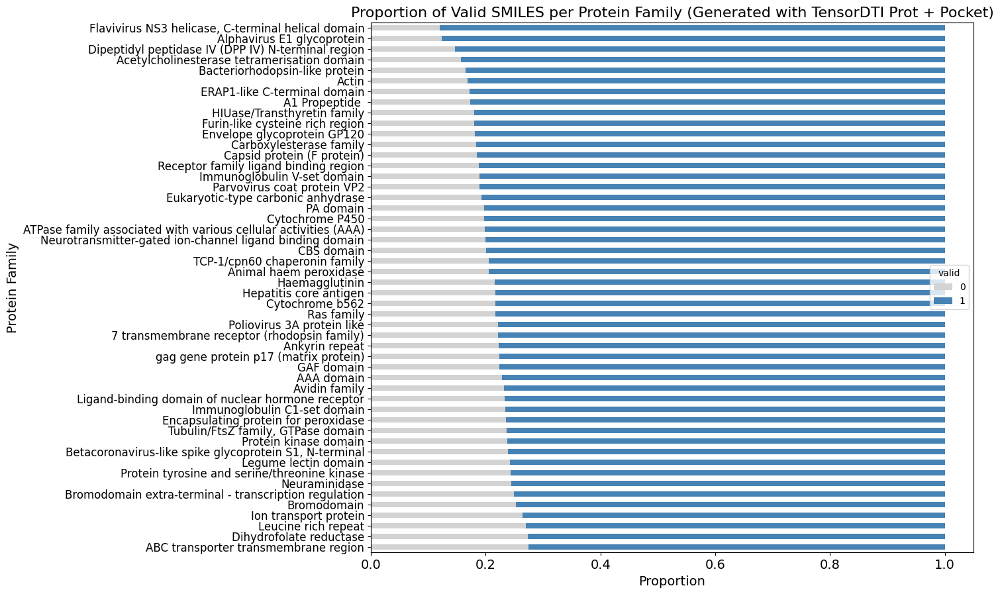

Validity Proportion - Mean: 0.791, SD: 0.036


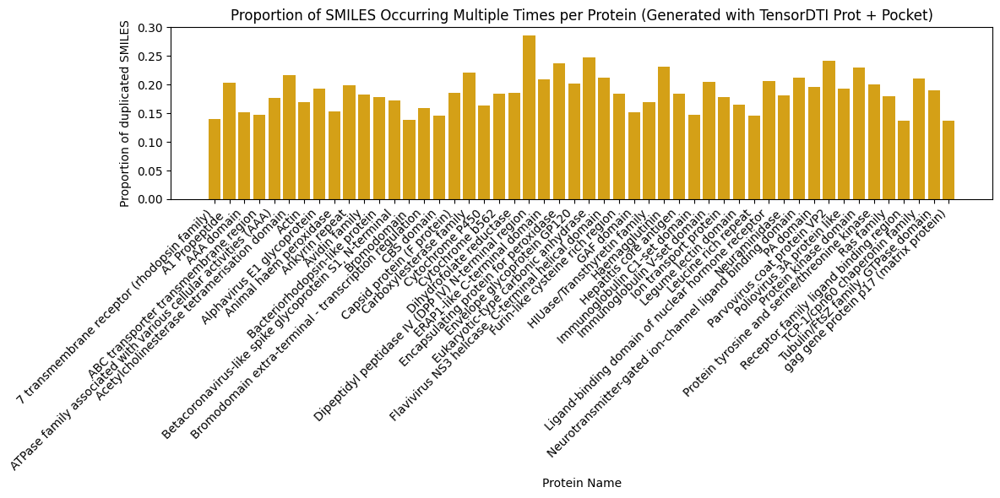

Duplicate Proportion - Mean: 0.187, SD: 0.032


In [69]:
valid_plot(generated_families_Tensor_pocket, "smiles", "valid", "Generated with TensorDTI Prot + Pocket", True, '/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/' )

In [70]:
Tensor_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/TensorDTIpocket_virus_toinfere_id.csv', sep=',')
# generated smiles with their corresponding family
generated_families_Tensor_pocket_infere = pd.merge(indomain_virus, Tensor_pocket_toinfere, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_Tensor_pocket_infere

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles,drug_id
0,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CC(=O)N[C@H]1[C@H]([C@H]2[C@H](O)[C@@H](NC(C)=...,6i0w_1334
1,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,O=C(O)C1=CC=CC(C2=CC=CC=C2)=C1,6i0w_1335
2,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,COC1=CC(C2=CC=CC=C(C(=O)N2)C(=O)C(O)C(C)(C)O)=C1,6i0w_1336
3,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,CCCCCCCCCCCCCCCCC(=O)O,6i0w_1337
4,6i0w,6i0w__1__1.A__1.H__1.H,1,train,6i0w__1__1.A__1.H,OC[C@H]1O[C@H](O)[C@H](O)[C@@H](O)[C@@H]1O,P00918,PF00194,PF00194,NaN,Eukaryotic-type carbonic anhydrase,6i0w,6i0w__1__1.A__1.H,1,COC1=CC=CC(OCCCCCC2=CC(C3=CC=NC=C3Cl)C=C2)C=C1...,6i0w_1338
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3527,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CCCCCCCCCCCCCCCCCCC(=O)O[C@H](CO[P@@](=O)(O)OC...,8sar_3527
3528,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,O=C1NC(=O)C2=CC=CC=C12,8sar_3528
3529,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](N)CO)...,8sar_3529
3530,8sar,8sar__1__1.I_1.L__1.X__1.X,1,train,8sar__1__1.I_1.L__1.X,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...,A0A1W6IPB2,PF00516,PF00516,NaN,Envelope glycoprotein GP120,8sar,8sar__1__1.I_1.L__1.X,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](COP(N)(O)O)[C@...,8sar_3530


Starting analysis for: Generated with TensorDTI Prot + Pocket


100%|██████████| 3532/3532 [00:06<00:00, 577.79it/s]


Molecular property computation complete!


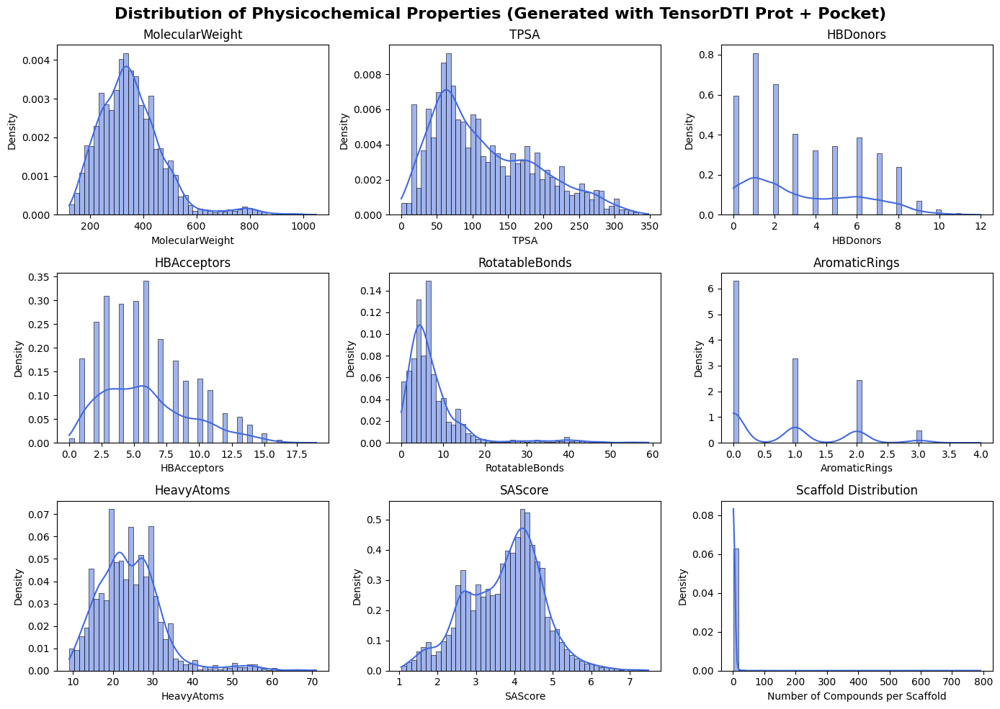

[16:42:23] Explicit valence for atom # 0 H, 3, is greater than permitted


Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/Generated_with_TensorDTI_Prot_+_Pocket_scaffolds.png
Synthetic Accessibility Score - Mean: 3.737, SD: 0.985
Analysis complete for: Generated with TensorDTI Prot + Pocket


In [71]:
df_Tensor_pocket_infere = analyze_molecules(generated_families_Tensor_pocket_infere, smiles_column="smiles", valid_column="valid", dataset_name="Generated with TensorDTI Prot + Pocket", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/')

## Comparisons between models

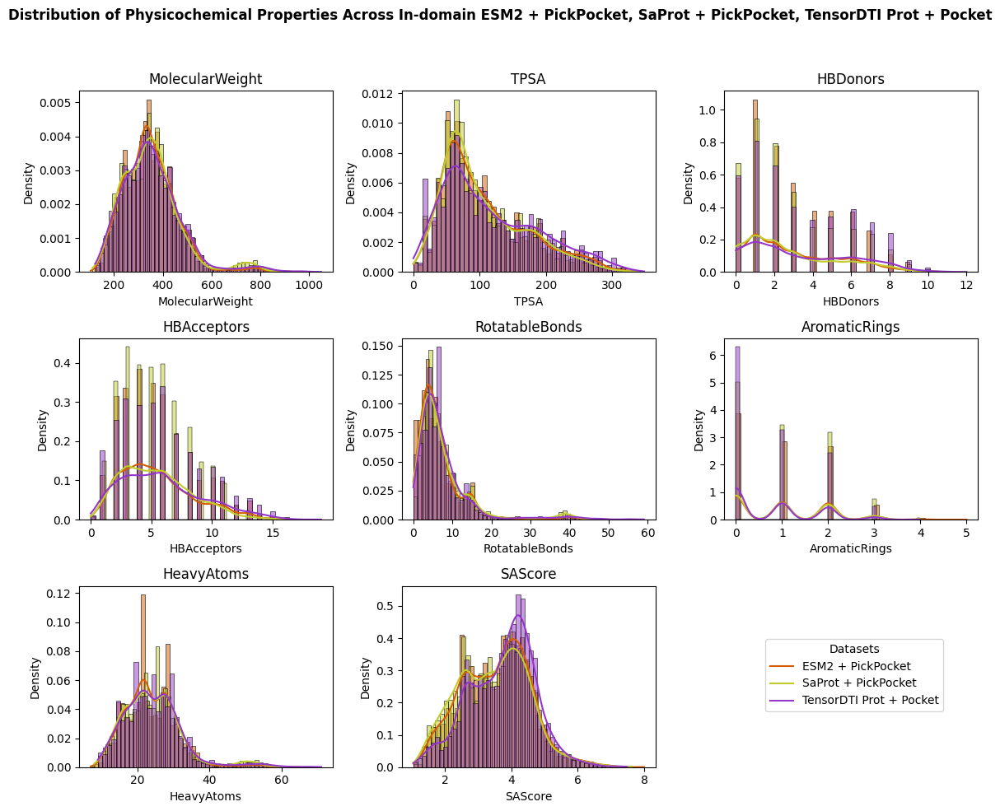

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "ESM2 + PickPocket": df_ESM2_pocket_infere,
    "SaProt + PickPocket": df_SaProt_pocket_infere,
    "TensorDTI Prot + Pocket": df_Tensor_pocket_infere,
}
colors = ['#D55E00', '#c1cc2d', '#9436c9']#,  "yellow"]  # Colors for datasets, "green"

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across In-domain {', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"in-domain_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

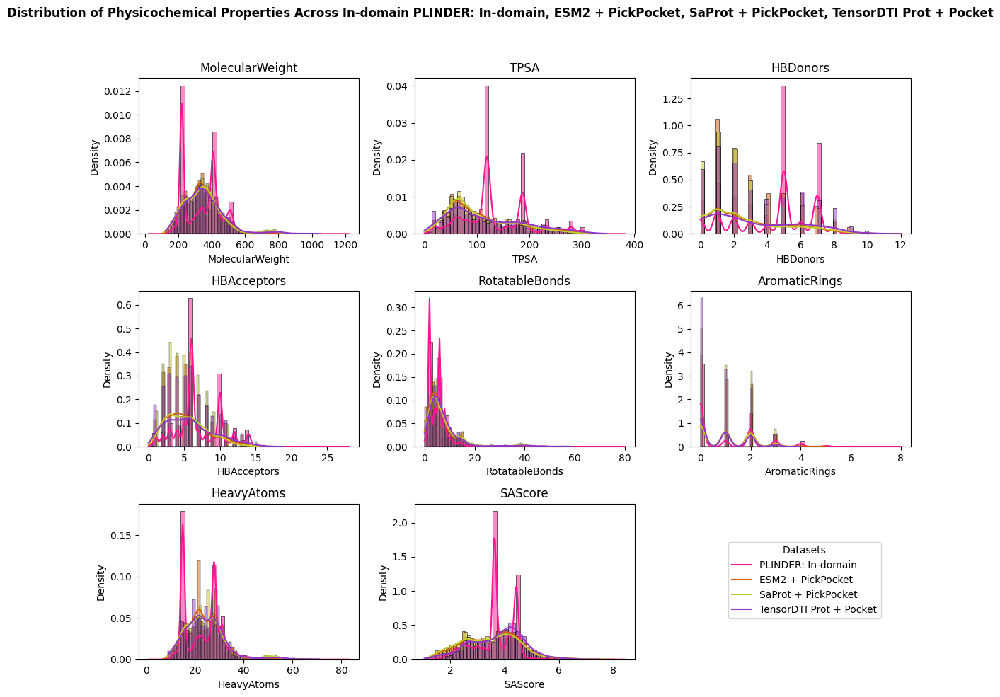

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: In-domain": virus_properties_train,
    "ESM2 + PickPocket": df_ESM2_pocket_infere,
    "SaProt + PickPocket": df_SaProt_pocket_infere,
    "TensorDTI Prot + Pocket": df_Tensor_pocket_infere,
}
plinder_color = '#FF1493'
colors = [plinder_color, '#D55E00', '#c1cc2d', '#9436c9']#,  "yellow"]  # Colors for datasets, "green"

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across In-domain {', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"plinder_in-domain_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

# Out-Domain

## ESM2 + PickPocket

In [74]:
ESM2_pocket = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/generate_SMILES_outdomain_yesvirus_ESM2prot_pickpocket_concat_ep6_loss0.16_all.tsv', sep=',')
ESM2_pocket

,protein_id,pocket_id,valid,smiles
0,6ho4,6ho4__1__1.A__1.B,1,CC(C)CCC[C@H](C)[C@H]1CCC[C@H]2[C@@H]3CC=C4C[C...
1,6ho4,6ho4__1__1.A__1.B,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
2,6ho4,6ho4__1__1.A__1.B,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
3,6ho4,6ho4__1__1.A__1.B,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
4,6ho4,6ho4__1__1.A__1.B,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
...,...,...,...,...
49995,6mwl,6mwl__1__1.B__1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49996,6mwl,6mwl__1__1.B__1.D,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49997,6mwl,6mwl__1__1.B__1.D,0,CC(C)C[C@H](NC(=O)NC(=O)[C@@H](N)CC1=NNC(=O)C2...
49998,6mwl,6mwl__1__1.B__1.D,0,COC1=CC=C(OCC2=CC=C(Cl)C(F)=C(Cl)C=C2)O


In [75]:
# generated smiles with their corresponding family
generated_families_ESM2_pocket = pd.merge(outdomain_virus, ESM2_pocket, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_ESM2_pocket

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles
0,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
1,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,OC[C@H]1O[C@H](O[C@H]2[C@H](O)[C@@H](O)[C@@H](...
2,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,0,O=C(O)C1=CC=C(NC(=O)C2=C(NC3=CC=C(Cl)C=C3)C=C2...
3,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,0,C[S@@H](NC1=CC=C(O)C=C1C(=O)NC1=CC=C(C(=O)O)C(...
4,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...
49996,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49997,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49998,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O


The generation has happened for 50 proteins


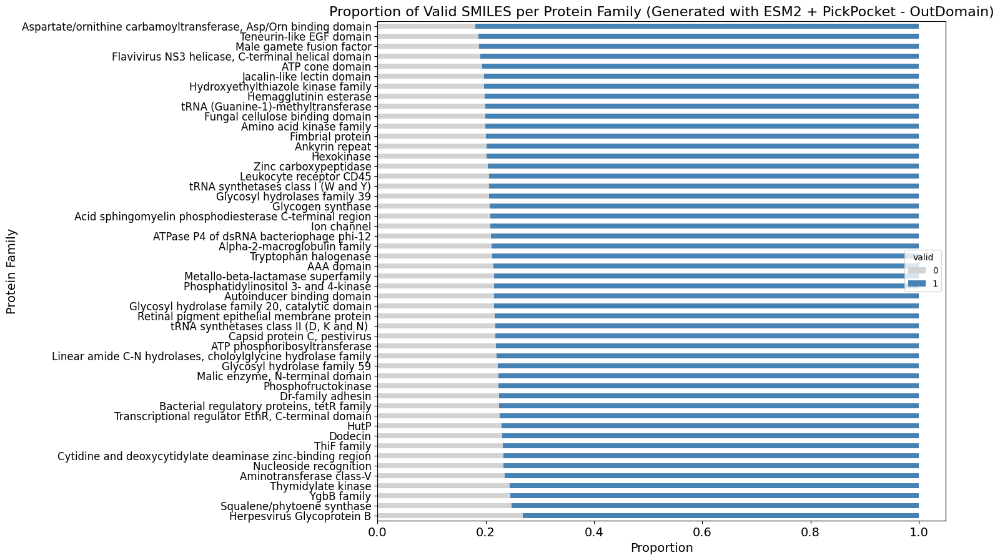

Validity Proportion - Mean: 0.786, SD: 0.017


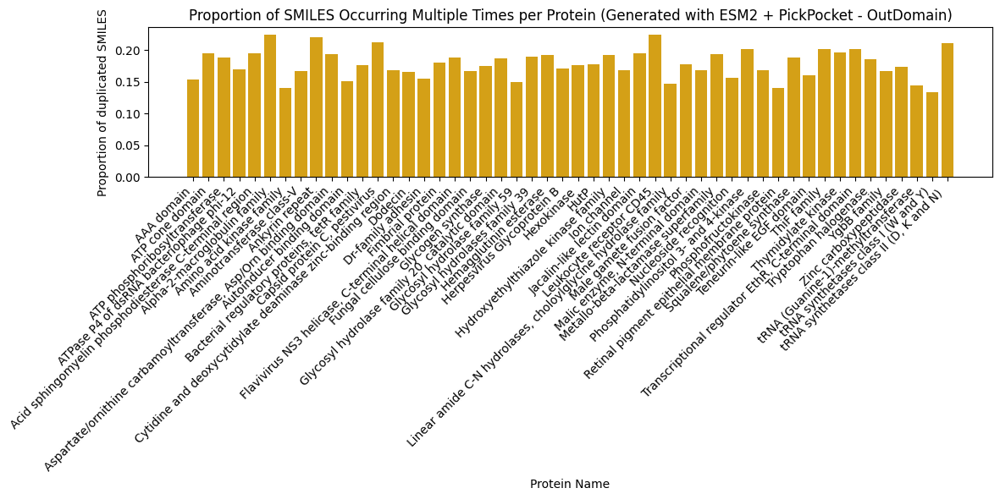

Duplicate Proportion - Mean: 0.178, SD: 0.022


In [76]:
valid_plot(generated_families_ESM2_pocket, "smiles", "valid", "Generated with ESM2 + PickPocket - OutDomain", True, '/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/' )

Starting analysis for: Generated with ESM2 + PickPocket - OutDomain


100%|██████████| 39276/39276 [00:52<00:00, 743.91it/s]
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-

Molecular property computation complete!


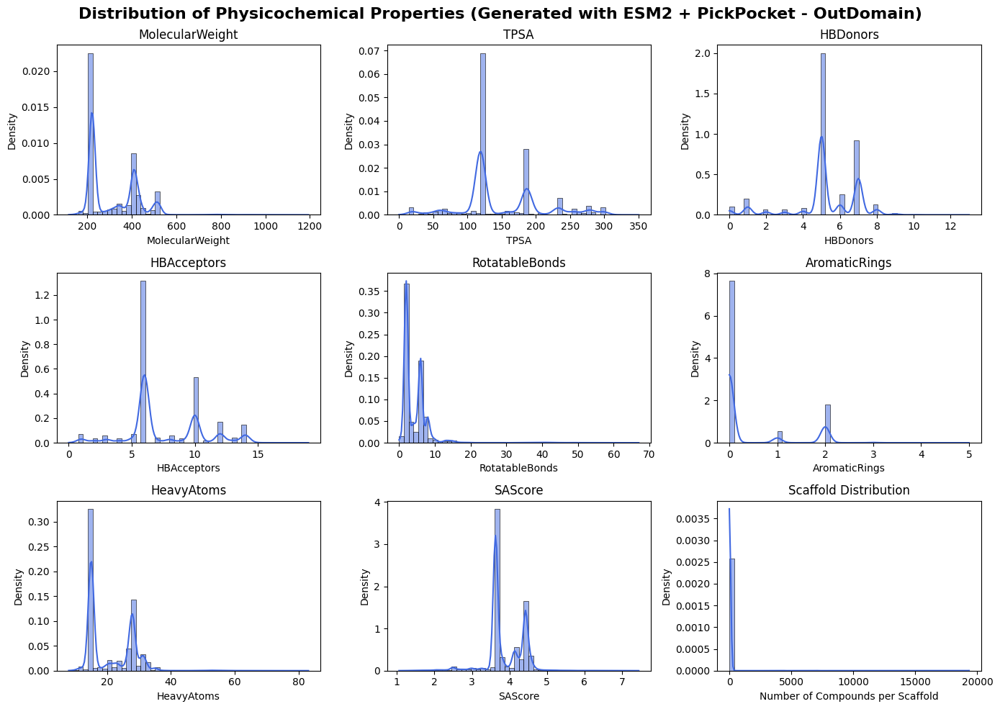

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/Generated_with_ESM2_+_PickPocket_-_OutDomain_scaffolds.png
Synthetic Accessibility Score - Mean: 3.884, SD: 0.509
Analysis complete for: Generated with ESM2 + PickPocket - OutDomain


In [77]:
# For generated_families_esm2_protonly (with validity column)
df_ESM2_pocket = analyze_molecules(generated_families_ESM2_pocket, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 + PickPocket - OutDomain", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/')

In [78]:
ESM2_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/ESM2pocket_out_toinfere_id.csv', sep=',')
# generated smiles with their corresponding family
generated_families_ESM2_pocket_infere = pd.merge(outdomain_virus, ESM2_pocket_toinfere, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_ESM2_pocket_infere

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles,drug_id
0,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,OC[C@H]1O[C@H](O[C@H]2[C@H](O)[C@@H](O)[C@@H](...,2vxa_1422
1,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC1=CC=C(S(=O)(=O)C(C)C(C)C)C=C1O,2vxa_1423
2,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC1=C(C(=O)NC2=CC=C(O)C(C3=CC(Cl)C=C3)=CC(C(=O...,2vxa_1424
3,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CCO[C@H]1O[C@@H](C=O)[C@@H](O)[C@@H]1O,2vxa_1425
4,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CN(C)C1=CC=C(C(=O)NC2=CC=C2O)N=C1,2vxa_1426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4182,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC1=CC(CC)=CC(C2=CC=C(C)CC=C2)=CC=C1CN1CCCCCCC1,5wgw_2064
4183,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,NC1=CC(C2=NC(CCN3CCC3)=NC2)=CC(=O)NC2=NC=C(F)C...,5wgw_2065
4184,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,O=C(O)C1=CC=C(NC2=CC=CC=C2)C=C1,5wgw_2066
4185,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,C[C@H](N)C(=O)N[C@@H](C)C(=O)O,5wgw_2067


Starting analysis for: Generated with ESM2 + PickPocket - OutDomain


100%|██████████| 4187/4187 [00:06<00:00, 697.42it/s]


Molecular property computation complete!


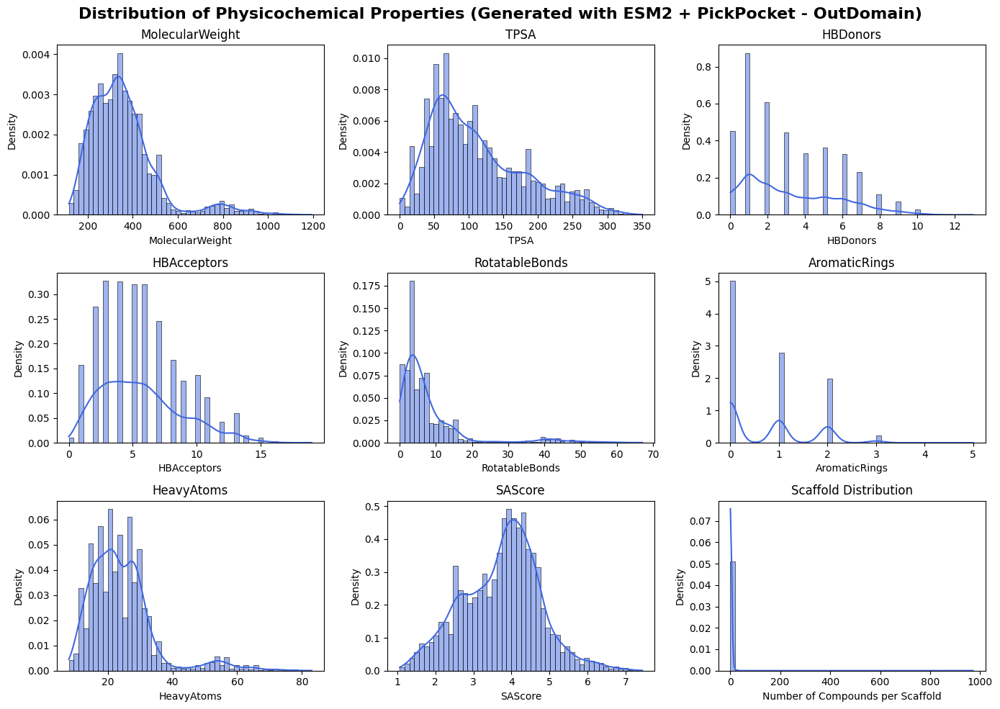

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/Generated_with_ESM2___PickPocket___OutDomain_scaffolds.png
Synthetic Accessibility Score - Mean: 3.733, SD: 1.012
Analysis complete for: Generated with ESM2 + PickPocket - OutDomain


In [ ]:
df_ESM2_pocket_infere = analyze_molecules(generated_families_ESM2_pocket_infere, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 + PickPocket - OutDomain", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/')

## SaProt + PickPocket

In [80]:
SaProt_pocket = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/generate_SMILES_outdomain_yesvirus_SaProt_pocket_concat_ep7_loss0.15_all.tsv', sep=',')
SaProt_pocket

,protein_id,pocket_id,valid,smiles
0,1usq,1usq__1__1.A__1.K,0,O=C(O)C1=CC=C(Cl)C=C1NC(=O)C1=O
1,1usq,1usq__1__1.A__1.K,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](COP(=O)(O)O)[C...
2,1usq,1usq__1__1.A__1.K,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
3,1usq,1usq__1__1.A__1.K,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](COP(=O)(O)O)[C...
4,1usq,1usq__1__1.A__1.K,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
...,...,...,...,...
49995,5ebe,5ebe__3__1.C__1.U,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49996,5ebe,5ebe__3__1.C__1.U,0,O=C1C(O)C(=O)C2=C(C=C(C3=CC=CC=C3)N2CCC2)C1
49997,5ebe,5ebe__3__1.C__1.U,1,OC[C@H]1O[C@@](CO)(O[C@@H]2O[C@H](CO)[C@@H](O)...
49998,5ebe,5ebe__3__1.C__1.U,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O


In [81]:
# generated smiles with their corresponding family
generated_families_SaProt_pocket = pd.merge(outdomain_virus, SaProt_pocket, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_SaProt_pocket

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles
0,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@](=O)(O)O...
1,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
2,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
3,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
4,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC[C@H](C)[C@H](N)C(=O)N[C@@H](CO)C(=O)N[C@@H]...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49996,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49997,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,O=C(O)[C@@H](CC1=CC=C(O)C=C1)N1CCC1
49998,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O


Starting analysis for: Generated with SaProt + PickPocket - OutDomain


100%|██████████| 39564/39564 [00:51<00:00, 765.79it/s]
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-

Molecular property computation complete!


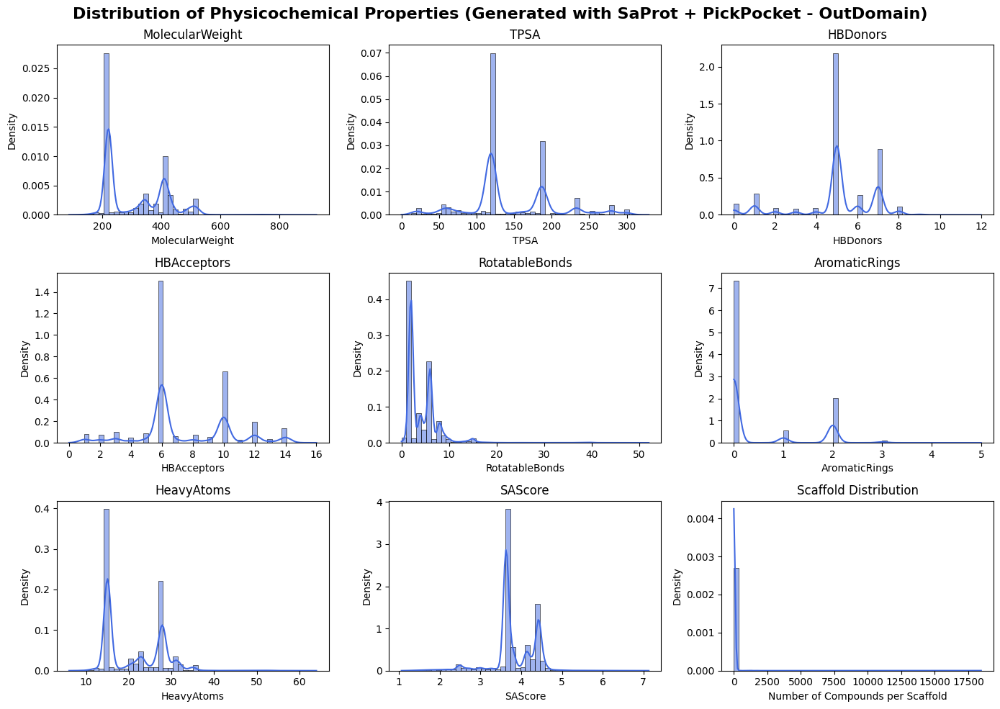

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/Generated_with_SaProt_+_PickPocket_-_OutDomain_scaffolds.png
Synthetic Accessibility Score - Mean: 3.819, SD: 0.549
Analysis complete for: Generated with SaProt + PickPocket - OutDomain


In [82]:
# For generated_families_esm2_protonly (with validity column)
df_SaProt_pocket = analyze_molecules(generated_families_SaProt_pocket, smiles_column="smiles", valid_column="valid", dataset_name="Generated with SaProt + PickPocket - OutDomain", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/')

The generation has happened for 50 proteins


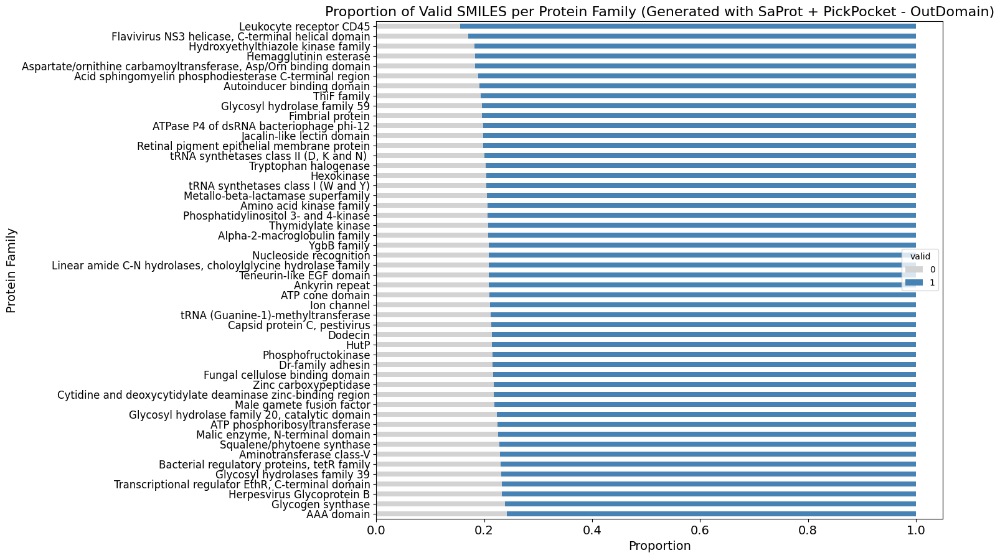

Validity Proportion - Mean: 0.791, SD: 0.017


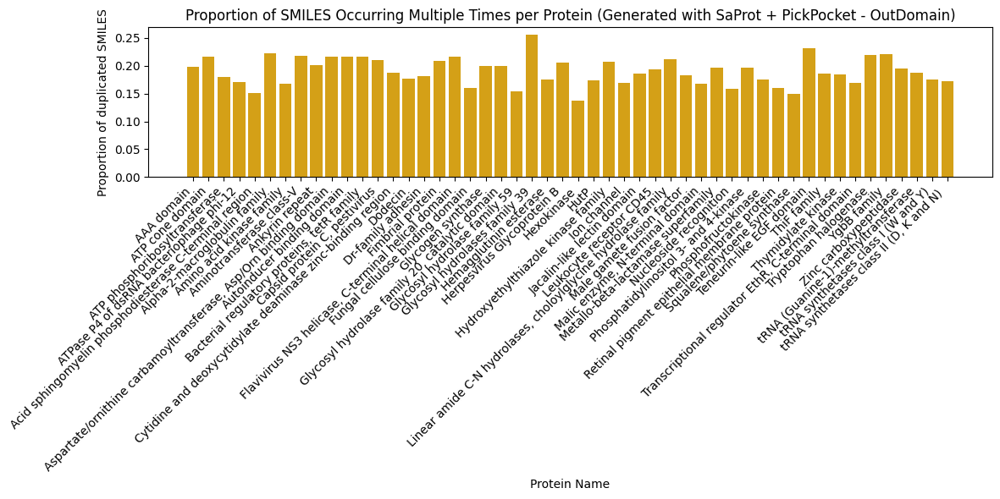

Duplicate Proportion - Mean: 0.190, SD: 0.024


In [83]:
valid_plot(generated_families_SaProt_pocket, "smiles", "valid", "Generated with SaProt + PickPocket - OutDomain", True, '/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/' )

In [84]:
SaProt_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/SaProtpocket_out_toinfere_id.csv', sep=',')
# generated smiles with their corresponding family
generated_families_SaProt_pocket_infere = pd.merge(outdomain_virus, SaProt_pocket_toinfere, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_SaProt_pocket_infere

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles,drug_id
0,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC[C@H](C)[C@H](N)C(=O)N[C@@H](CO)C(=O)N[C@@H]...,2vxa_3413
1,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CCON=CC1=CC=C(OCCCCCN2CCN(C3=CC=NC=N3)C2=O)C=C1,2vxa_3414
2,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CCCCCCCCCC=CCCCCCCC(=O)OC[C@H](COC(=O)CCCCCCCC...,2vxa_3415
3,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,C[C@@H](N)C(=O)N[C@@H](C)C(=O)N[C@@H](CO)C(=O)O,2vxa_3416
4,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CCON=CC1=CC=C(OCC[C@H](C)CCCN2C=CC=C2)C=C1,2vxa_3417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4422,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CCCCCCCCC(C)=CCCCCCC(=O)O[C@H](C)CO,5wgw_3408
4423,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,OC[C@H]1O[C@H](CO)[C@@H](O)[C@H]1O,5wgw_3409
4424,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CCCNCC1=NC(C(C(=O)OCC2=CC=C(O)C=C2)=N1)C1=CC=C...,5wgw_3410
4425,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,COC1=CC(OCCCCCCOCC2=CC=C(OC3=CC=C(C)N=N3)C=C2C...,5wgw_3411


Starting analysis for: Generated with SaProt + PickPocket - OutDomain


100%|██████████| 4427/4427 [00:06<00:00, 730.32it/s]


Molecular property computation complete!


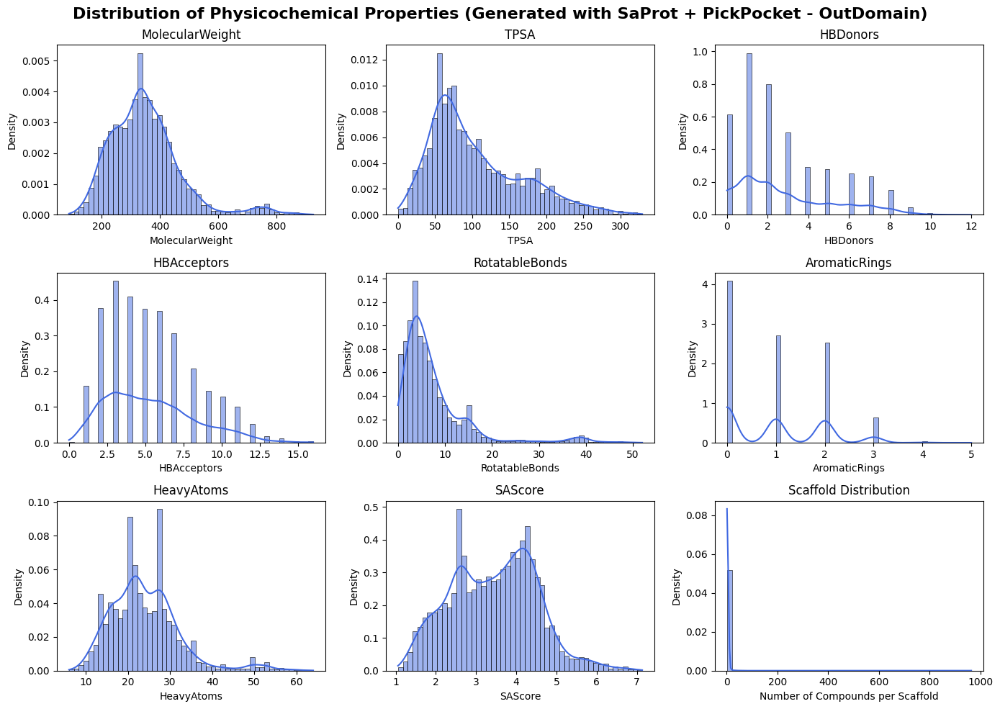

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/Generated_with_SaProt_+_PickPocket_-_OutDomain_scaffolds.png
Synthetic Accessibility Score - Mean: 3.439, SD: 1.058
Analysis complete for: Generated with SaProt + PickPocket - OutDomain


In [85]:
df_SaProt_pocket_infere = analyze_molecules(generated_families_SaProt_pocket_infere, smiles_column="smiles", valid_column="valid", dataset_name="Generated with SaProt + PickPocket - OutDomain", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/SaProt/')

## TensorDTI + PickPocket

In [86]:
Tensor_pocket = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/generate_SMILES_outdomain_yesvirus_tensorDTIprot_tensorDTIpocket_concat_ep6_loss0.16_all.tsv', sep=',')
Tensor_pocket

,protein_id,pocket_id,valid,smiles
0,2buf,2buf__1__1.C__1.R_1.S,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
1,2buf,2buf__1__1.C__1.R_1.S,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@](=O)(O)O...
2,2buf,2buf__1__1.C__1.R_1.S,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
3,2buf,2buf__1__1.C__1.R_1.S,1,CC(C)CCC[C@@H](C)[C@H]1CC[C@H]2[C@@H]3CC=C4C[C...
4,2buf,2buf__1__1.C__1.R_1.S,0,COC1=CC=C2C=C1C(=O)OC1=C(O)C=CC=C1C(=O)C1=CC=C...
...,...,...,...,...
49995,6fu2,6fu2__1__1.C_1.D__1.F_1.G_1.I_1.J,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49996,6fu2,6fu2__1__1.C_1.D__1.F_1.G_1.I_1.J,1,NC1=NC=NC2=C1N=CN2[C@@H]1O[C@H](CO[P@](=O)(O)O...
49997,6fu2,6fu2__1__1.C_1.D__1.F_1.G_1.I_1.J,0,O=P(O)(O)OC(C(F)(F)F)(F)(F)F
49998,6fu2,6fu2__1__1.C_1.D__1.F_1.G_1.I_1.J,1,O=C1N[C@H]([C@H]2C[C@@H](O)[C@@H](COP(=O)(O)O)...


In [87]:
# generated smiles with their corresponding family
generated_families_Tensor_pocket = pd.merge(outdomain_virus, Tensor_pocket, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_Tensor_pocket

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles
0,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
1,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,NC1=NC2=C(N=CN2[C@@H]2O[C@H](CO[P@](=O)(O)OP(=...
2,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
3,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
4,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,0,CC(C=CC=C(C)C=CC1=C(C)CCC[C@H](C)CCC1(C)C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,0,N[C@@H]1CC[C@@H]3NC(=O)N[C@@H](CO)C(=O)N[C@@H]...
49996,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC(=O)N[C@H]1[C@H](O[C@H]2[C@H](O)[C@@H](NC(C)...
49997,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O
49998,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CC(=O)N[C@@H]1[C@@H](O)[C@H](O)[C@@H](CO)O[C@H]1O


Starting analysis for: Generated with TensorDTI Prot + Pocket - OutDomain


100%|██████████| 38897/38897 [00:51<00:00, 750.14it/s]
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-input-12-3779134664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "Scaffolds", "SAScore"]] = \
/tmp/ipython-

Molecular property computation complete!


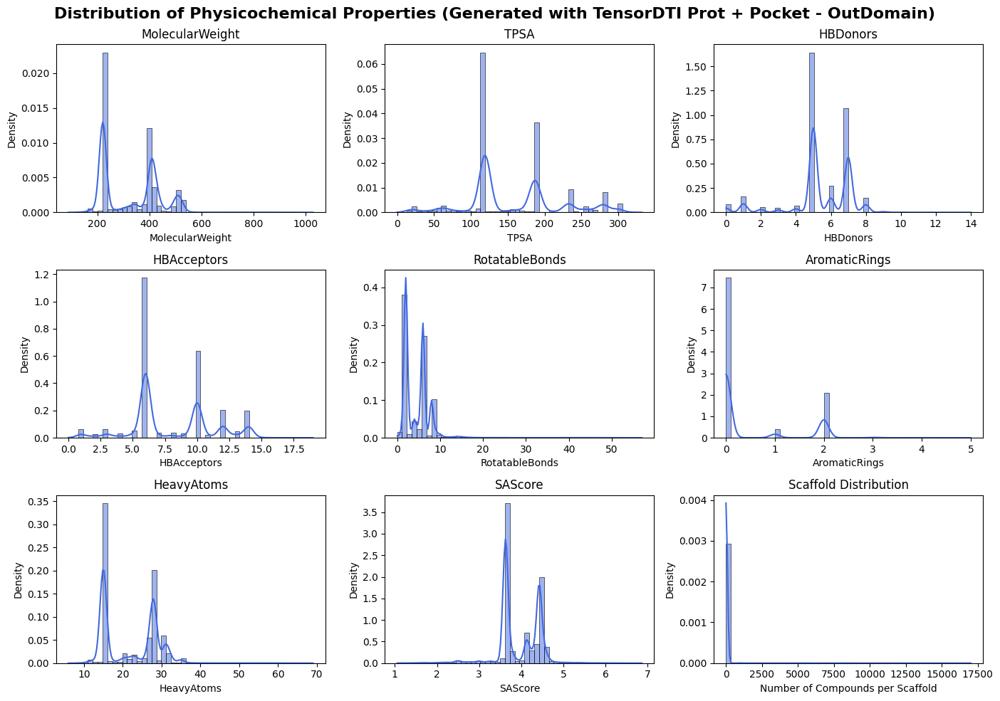

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/Generated_with_TensorDTI_Prot_+_Pocket_-_OutDomain_scaffolds.png
Synthetic Accessibility Score - Mean: 3.950, SD: 0.504
Analysis complete for: Generated with TensorDTI Prot + Pocket - OutDomain


In [88]:
# For generated_families_esm2_protonly (with validity column)
df_Tensor_pocket = analyze_molecules(generated_families_Tensor_pocket, smiles_column="smiles", valid_column="valid", dataset_name="Generated with TensorDTI Prot + Pocket - OutDomain", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/')

The generation has happened for 50 proteins


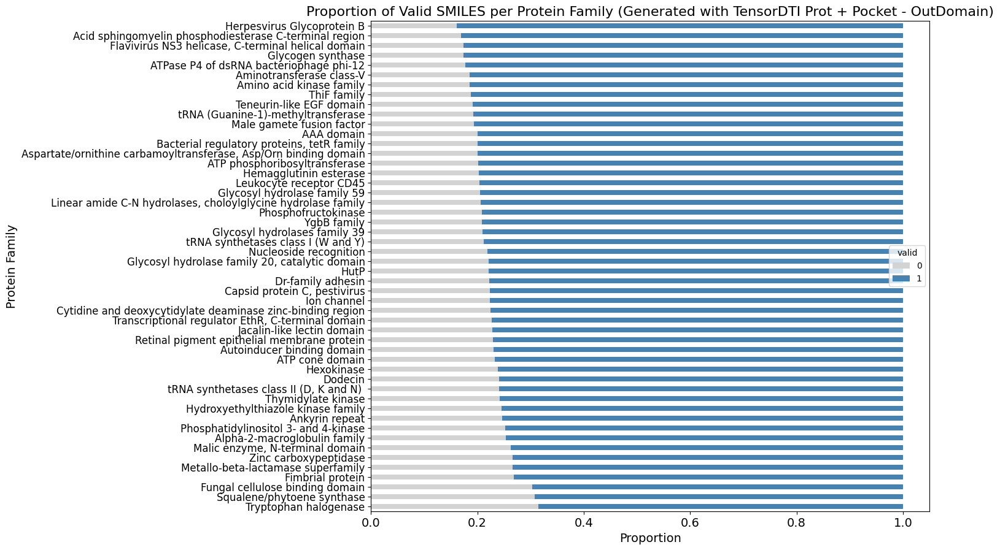

Validity Proportion - Mean: 0.778, SD: 0.035


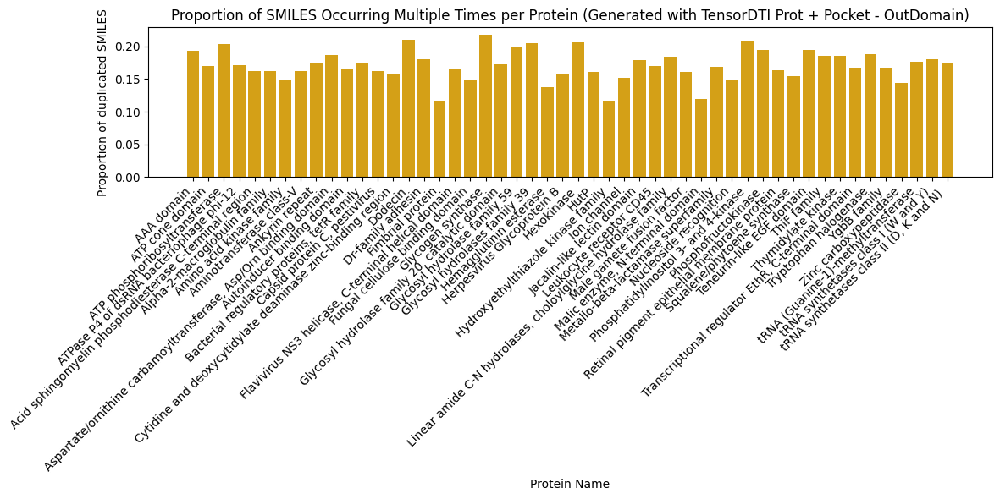

Duplicate Proportion - Mean: 0.171, SD: 0.023


In [89]:
valid_plot(generated_families_Tensor_pocket, "smiles", "valid", "Generated with TensorDTI Prot + Pocket - OutDomain", True, '/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/' )

In [90]:
Tensor_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/TensorDTIpocket_out_toinfere_id.csv', sep=',')
# generated smiles with their corresponding family
generated_families_Tensor_pocket_infere = pd.merge(outdomain_virus, Tensor_pocket_toinfere, left_on='pdb_id', right_on='protein_id', how='left')
generated_families_Tensor_pocket_infere

,pdb_id,ligand_id,Label,split,pocket_key,cleaned_smiles,uniprot_id,Pfam_Families,pfam_id,pfam_name,clan_name,protein_id,pocket_id,valid,smiles,drug_id
0,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,NC1=NC(=O)N([C@H]2C[C@H](O)[C@@H](CO[P@@](=O)(...,2vxa_2566
1,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CCCCCCCCCCC=CCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCC...,2vxa_2567
2,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CCCCCCCCCCCC[N+](C)(C)CCC,2vxa_2568
3,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,CC1=NOC(CCCCOC2=C(C)C=C(C3=NOC(C(C)(F)F)=N3)C=...,2vxa_2569
4,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S__1.KA,1,test,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,CC1=CC2=C(C=C1C)N(C[C@H](O)[C@H](O)[C@H](O)CO)...,A1WUH0,PF07311,PF07311,SHS2,Dodecin,2vxa,2vxa__1__1.B_1.C_1.G_1.H__1.KA_1.S,1,NC(=O)C1=CC=C(F)C=C1,2vxa_2570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3910,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CO[C@@H]1O[C@@H](COP(=O)(O)O)[C@H](O)[C@@H](O)...,5wgw_2028
3911,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,O=C1C=CCN([C@H]2C[C@H](O)[C@@H](COP(=O)(O)O)[C...,5wgw_2029
3912,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CN1CN([C@H](CO[P@@H]2O[P@](=O)(O)O[P@@](=O)(O)...,5wgw_2030
3913,5wgw,5wgw__1__1.A__1.O__1.O,1,test,5wgw__1__1.A__1.O,CC1(C)C2=C(C[C@@]34CN5CCC[C@]5(C[C@@H]13)C(=O)...,L0E155,PF04820,PF04820,NADP_Rossmann,Tryptophan halogenase,5wgw,5wgw__1__1.A__1.O,1,CCCCC1=CC(OC[C@@H](C)C=C1)C[P@@](=O)(O)O[C@H](...,5wgw_2031


Starting analysis for: Generated with TensorDTI Prot + Pocket - OutDomain


100%|██████████| 3915/3915 [00:05<00:00, 727.71it/s]


Molecular property computation complete!


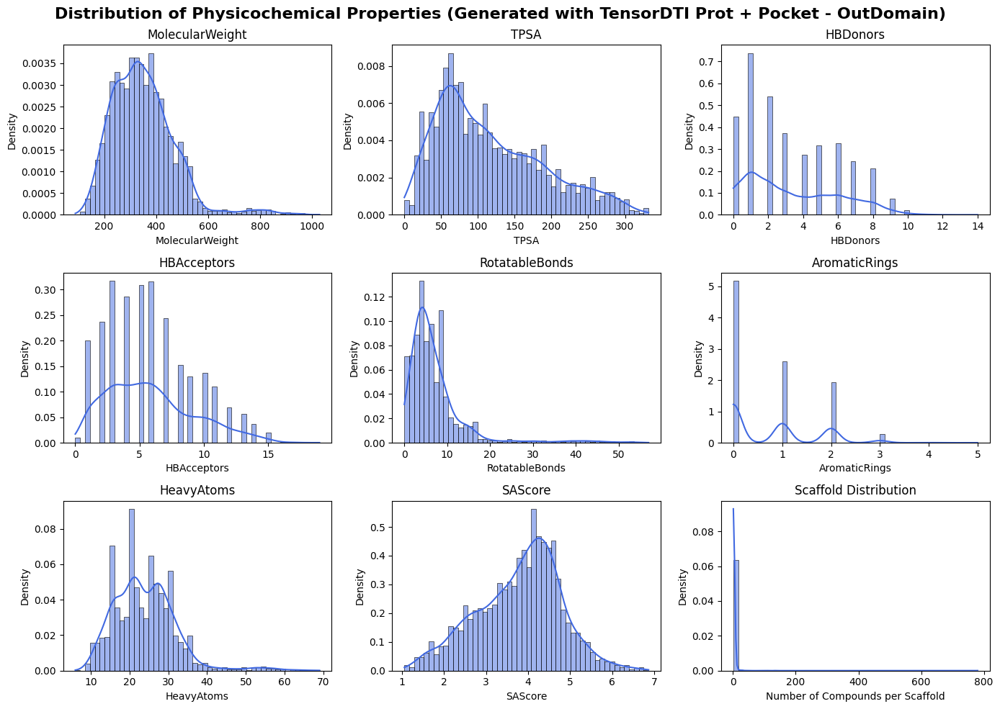

Scaffolds Saved: /content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/Generated_with_TensorDTI_Prot_+_Pocket_-_OutDomain_scaffolds.png
Synthetic Accessibility Score - Mean: 3.786, SD: 0.999
Analysis complete for: Generated with TensorDTI Prot + Pocket - OutDomain


In [91]:
df_Tensor_pocket_infere = analyze_molecules(generated_families_Tensor_pocket_infere, smiles_column="smiles", valid_column="valid", dataset_name="Generated with TensorDTI Prot + Pocket - OutDomain", save_plots=True, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/TensorDTI/')

## Comparisons between models

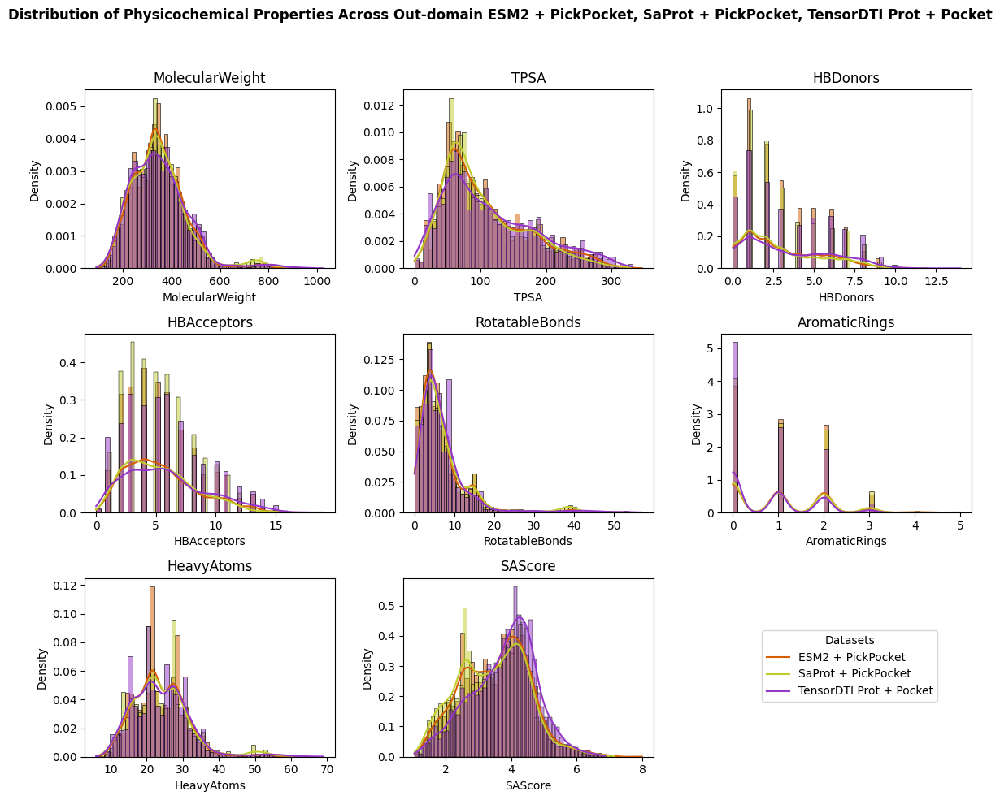

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "ESM2 + PickPocket": df_ESM2_pocket_infere,
    "SaProt + PickPocket": df_SaProt_pocket_infere,
    "TensorDTI Prot + Pocket": df_Tensor_pocket_infere,
}
colors = ['#D55E00', '#c1cc2d', '#9436c9']#,  "yellow"]  # Colors for datasets, "green"

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across Out-domain {', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"out-domain_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

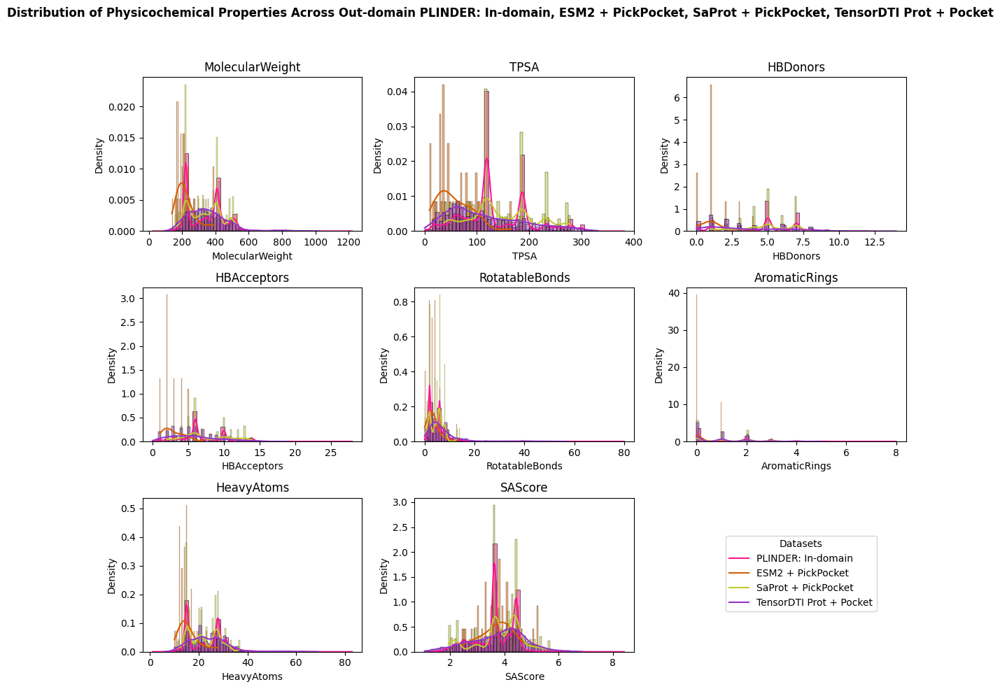

In [153]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: In-domain": virus_properties_train,
    "ESM2 + PickPocket": df_ESM2_pocket_infere,
    "SaProt + PickPocket": df_SaProt_pocket_infere,
    "TensorDTI Prot + Pocket": df_Tensor_pocket_infere,
}
plinder_color = '#FF1493'
colors = [plinder_color, '#D55E00', '#c1cc2d', '#9436c9']#,  "yellow"]  # Colors for datasets, "green"

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across Out-domain {', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"plinder_out-domain_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

# Binding Pocket Specificity

## CDK2

### ESM2 + PickPocket

In [106]:
ESM2_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/ESM2_CDK2_toinfere_good.csv', sep=',')

In [109]:
# Split based on site_type
esm2_cryptic_site_df = ESM2_pocket_toinfere[ESM2_pocket_toinfere['site_type'] == 'cryptic site']
esm2_active_site_df = ESM2_pocket_toinfere[ESM2_pocket_toinfere['site_type'] == 'active site']

Starting analysis for: Generated with ESM2 + PickPocket - CDK2 - cryptic


100%|██████████| 34/34 [00:00<00:00, 517.78it/s]

Molecular property computation complete!


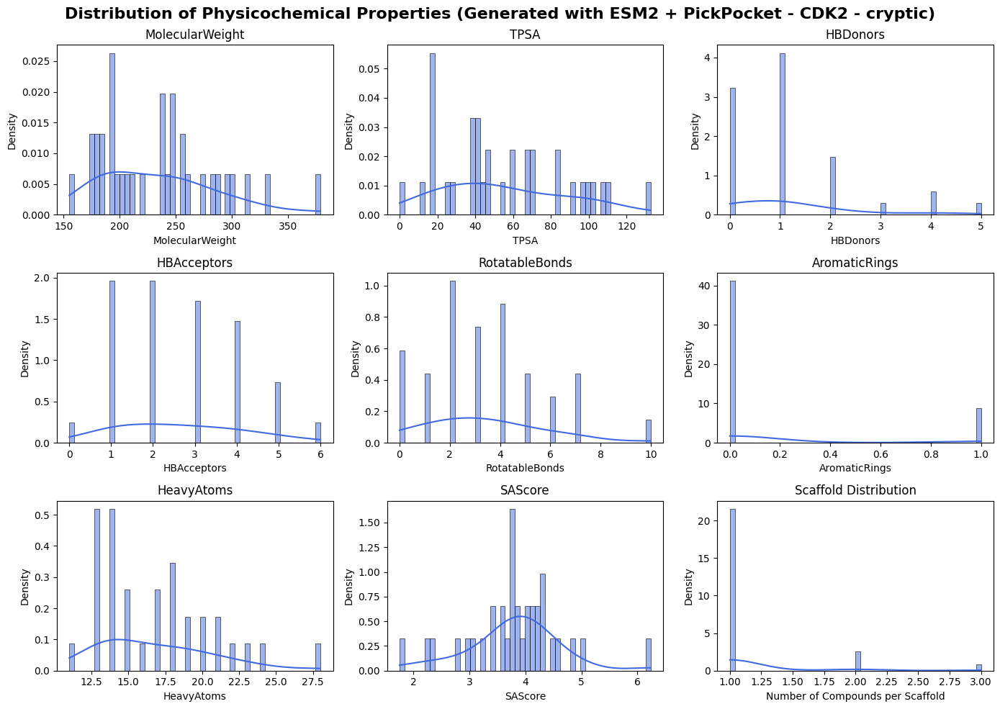

Synthetic Accessibility Score - Mean: 3.799, SD: 0.832
Analysis complete for: Generated with ESM2 + PickPocket - CDK2 - cryptic
Starting analysis for: Generated with ESM2 + PickPocket - CDK2 - active


100%|██████████| 38/38 [00:00<00:00, 201.50it/s]


Molecular property computation complete!


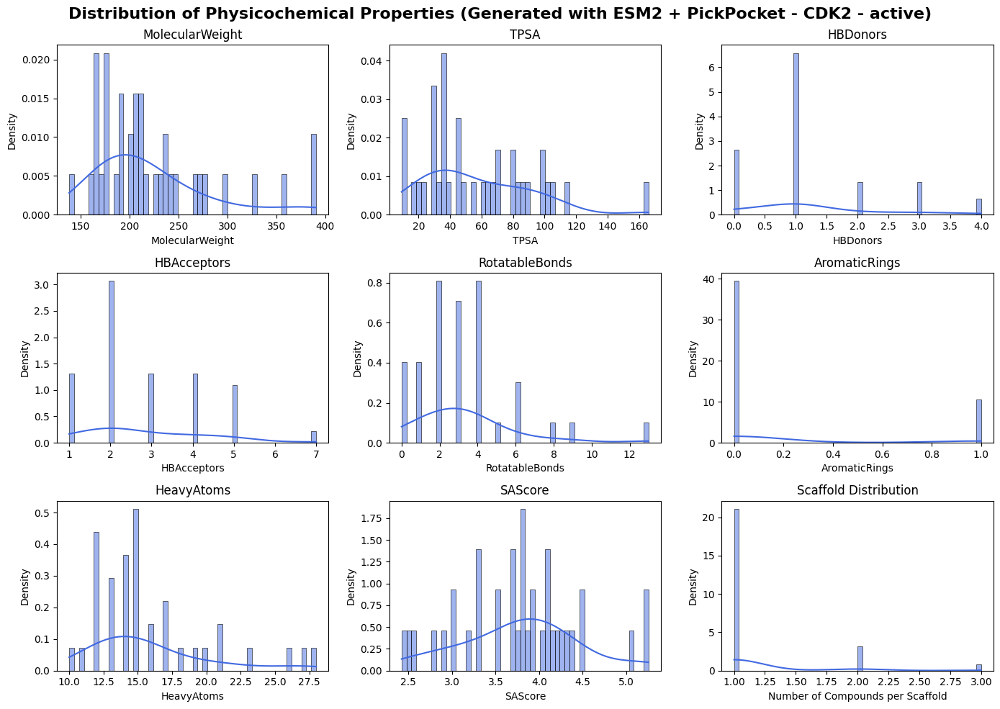

Synthetic Accessibility Score - Mean: 3.774, SD: 0.684
Analysis complete for: Generated with ESM2 + PickPocket - CDK2 - active


In [113]:
df_ESM2_pocket_infere_cryptic = analyze_molecules(esm2_cryptic_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 + PickPocket - CDK2 - cryptic", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')
df_ESM2_pocket_infere_active = analyze_molecules(esm2_active_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 + PickPocket - CDK2 - active", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')

### SaProt + PickPocket

In [129]:
SaProt_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/SaProt_CDK2_toinfere_good.csv', sep=',')

In [130]:
# Split based on site_type
saprot_cryptic_site_df = SaProt_pocket_toinfere[SaProt_pocket_toinfere['site_type'] == 'cryptic site']
saprot_active_site_df = SaProt_pocket_toinfere[SaProt_pocket_toinfere['site_type'] == 'active site']

Starting analysis for: Generated with SaProt + PickPocket - cryptic


100%|██████████| 17/17 [00:00<00:00, 627.19it/s]

Molecular property computation complete!


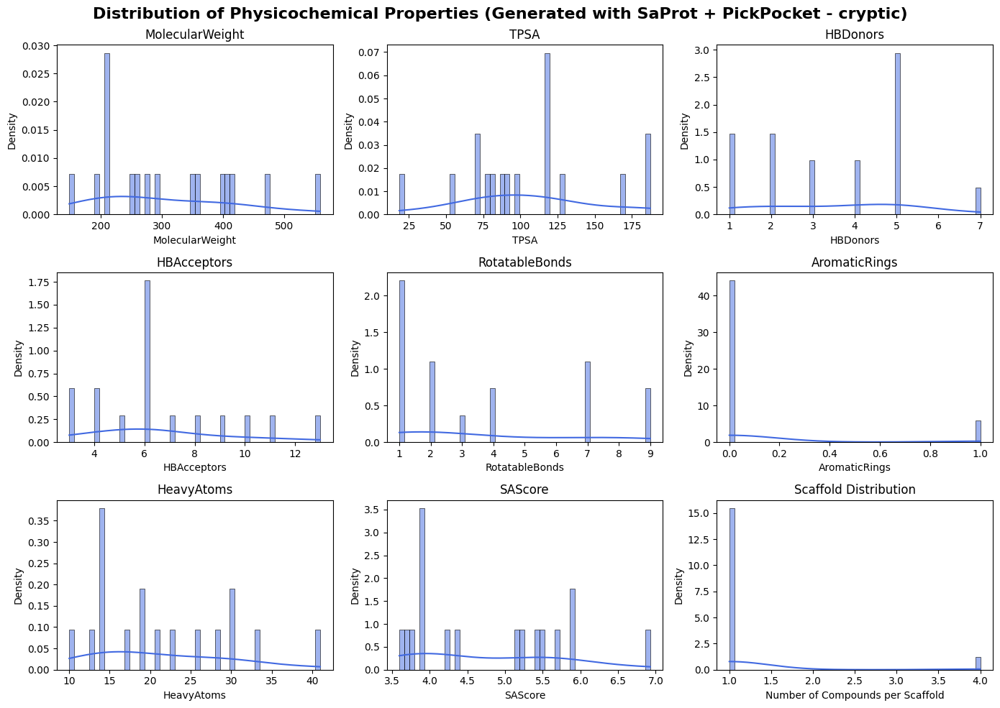

Synthetic Accessibility Score - Mean: 4.754, SD: 1.011
Analysis complete for: Generated with SaProt + PickPocket - cryptic
Starting analysis for: Generated with SaProt + PickPocket - active


100%|██████████| 25/25 [00:00<00:00, 713.88it/s]

Molecular property computation complete!


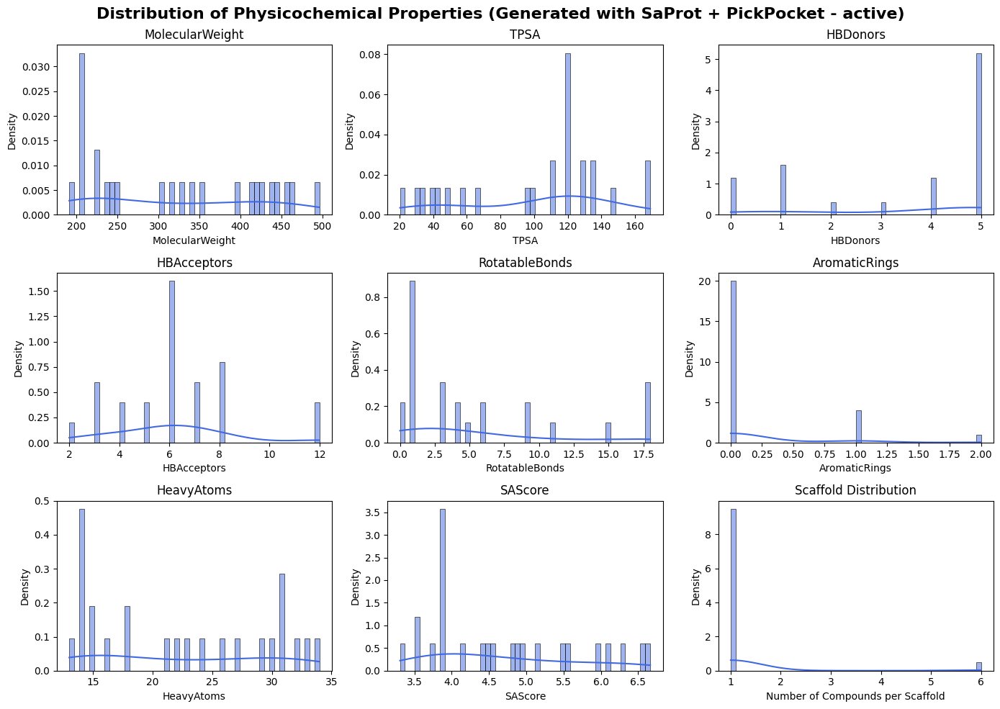

Synthetic Accessibility Score - Mean: 4.699, SD: 1.021
Analysis complete for: Generated with SaProt + PickPocket - active


In [131]:
df_SaProt_pocket_infere_cryptic = analyze_molecules(saprot_cryptic_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with SaProt + PickPocket - cryptic", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')
df_SaProt_pocket_infere_active = analyze_molecules(saprot_active_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with SaProt + PickPocket - active", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')

### TensorDTI + PickPocket

In [123]:
Tensor_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/TensorDTI_CDK2_toinfere_good.csv', sep=',')

In [124]:
# Split based on site_type
tensor_cryptic_site_df = Tensor_pocket_toinfere[Tensor_pocket_toinfere['site_type'] == 'cryptic site']
tensor_active_site_df = Tensor_pocket_toinfere[Tensor_pocket_toinfere['site_type'] == 'active site']

Starting analysis for: Generated with  Tensor Prot+Pocket - cryptic


100%|██████████| 67/67 [00:00<00:00, 710.39it/s]

Molecular property computation complete!


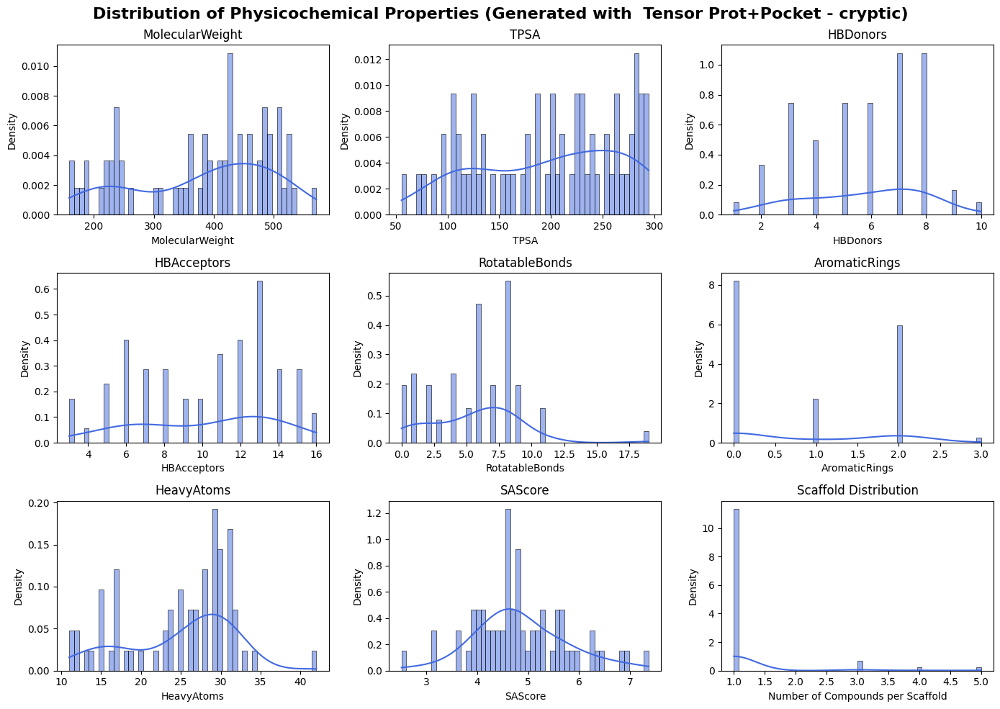

Synthetic Accessibility Score - Mean: 4.853, SD: 0.914
Analysis complete for: Generated with  Tensor Prot+Pocket - cryptic
Starting analysis for: Generated with Tensor Prot+Pocket - active


100%|██████████| 84/84 [00:00<00:00, 686.64it/s]

Molecular property computation complete!


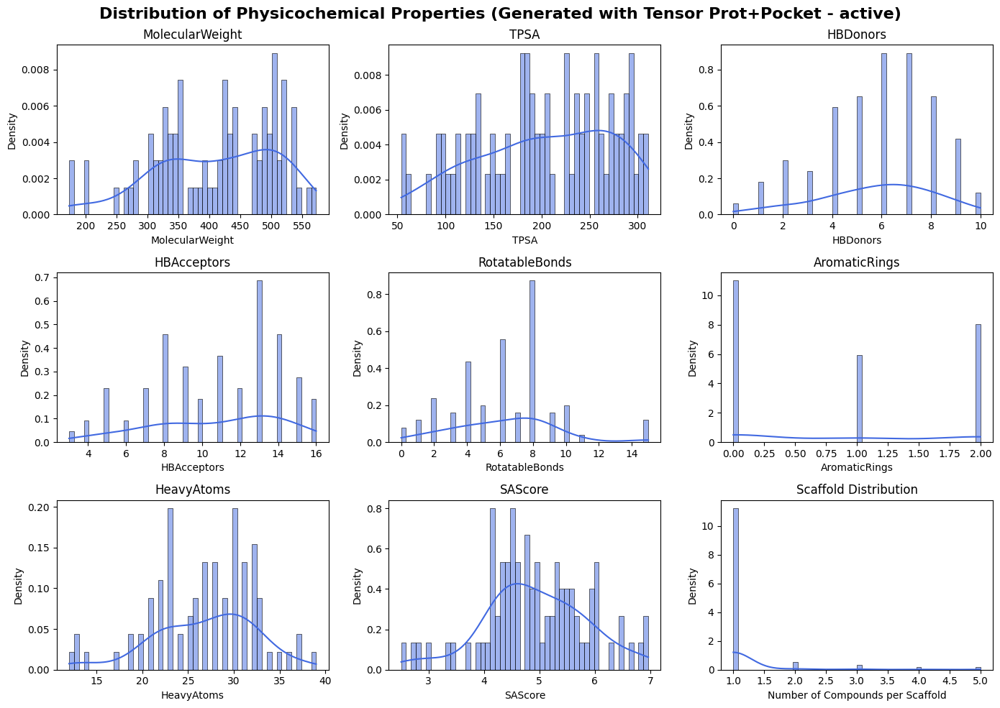

Synthetic Accessibility Score - Mean: 4.927, SD: 0.928
Analysis complete for: Generated with Tensor Prot+Pocket - active


In [128]:
df_tensor_pocket_infere_cryptic = analyze_molecules(tensor_cryptic_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with  Tensor Prot+Pocket - cryptic", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')
df_tensor_pocket_infere_active = analyze_molecules(tensor_active_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with Tensor Prot+Pocket - active", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')

### Comparisons between models

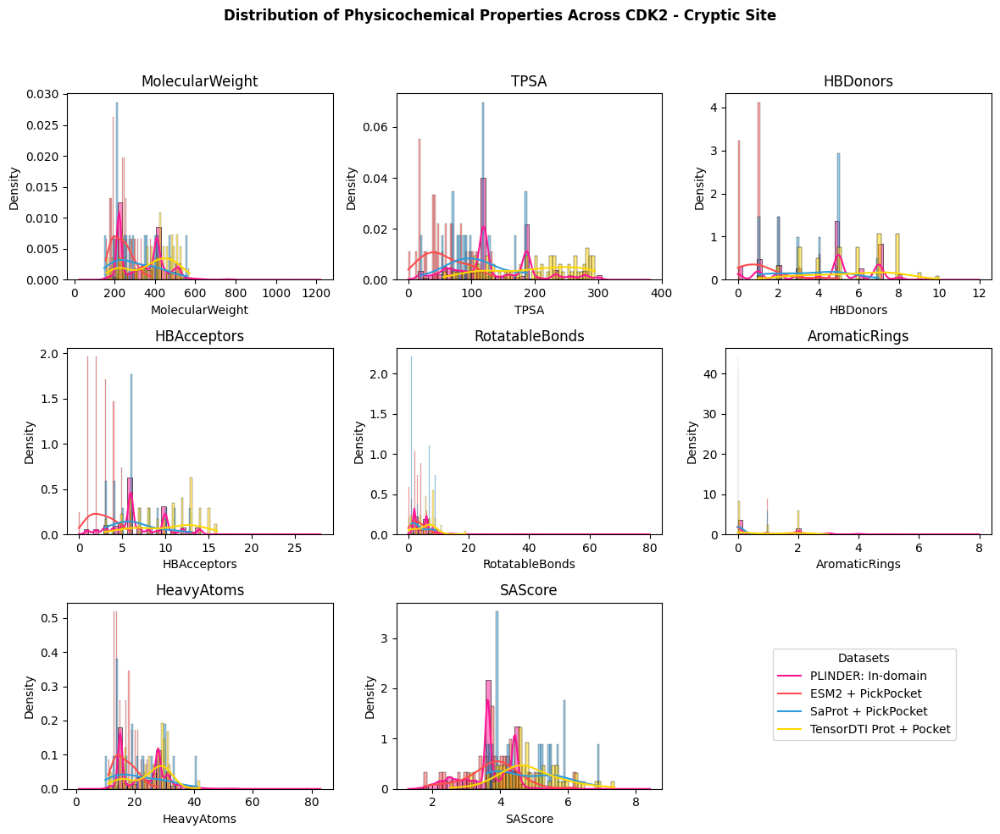

In [136]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: In-domain": virus_properties_train,
    "ESM2 + PickPocket": df_ESM2_pocket_infere_cryptic,
    "SaProt + PickPocket": df_SaProt_pocket_infere_cryptic,
    "TensorDTI Prot + Pocket": df_tensor_pocket_infere_cryptic,
}
plinder_color = '#FF1493'
colors = [plinder_color, "#FF4C4C", "#2D9CDB", "#FFD700"]

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across CDK2 - Cryptic Site", #{', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"cdk2-cryptic_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

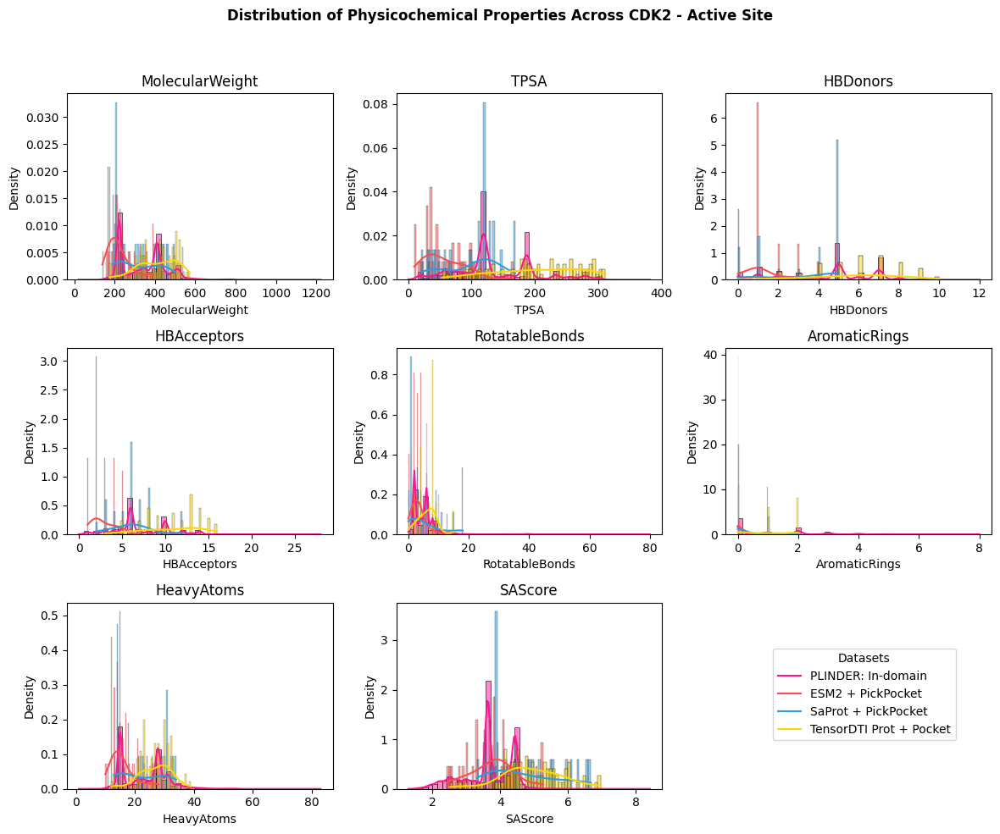

In [137]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: In-domain": virus_properties_train,
    "ESM2 + PickPocket": df_ESM2_pocket_infere_active,
    "SaProt + PickPocket": df_SaProt_pocket_infere_active,
    "TensorDTI Prot + Pocket": df_tensor_pocket_infere_active,
}
plinder_color = '#FF1493'
colors = [plinder_color, "#FF4C4C", "#2D9CDB", "#FFD700"]

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across CDK2 - Active Site", #{', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"cdk2-active_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

## RET


### ESM2 + PickPocket

In [140]:
ESM2_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/ESM2_RET_toinfere_id.csv', sep=',')

In [141]:
# Split based on site_type
esm2_cryptic_site_df = ESM2_pocket_toinfere[ESM2_pocket_toinfere['site_type'] == 'cryptic site']
esm2_active_site_df = ESM2_pocket_toinfere[ESM2_pocket_toinfere['site_type'] == 'active site']

Starting analysis for: Generated with ESM2 + PickPocket - RET - cryptic


100%|██████████| 33/33 [00:00<00:00, 883.91it/s]

Molecular property computation complete!


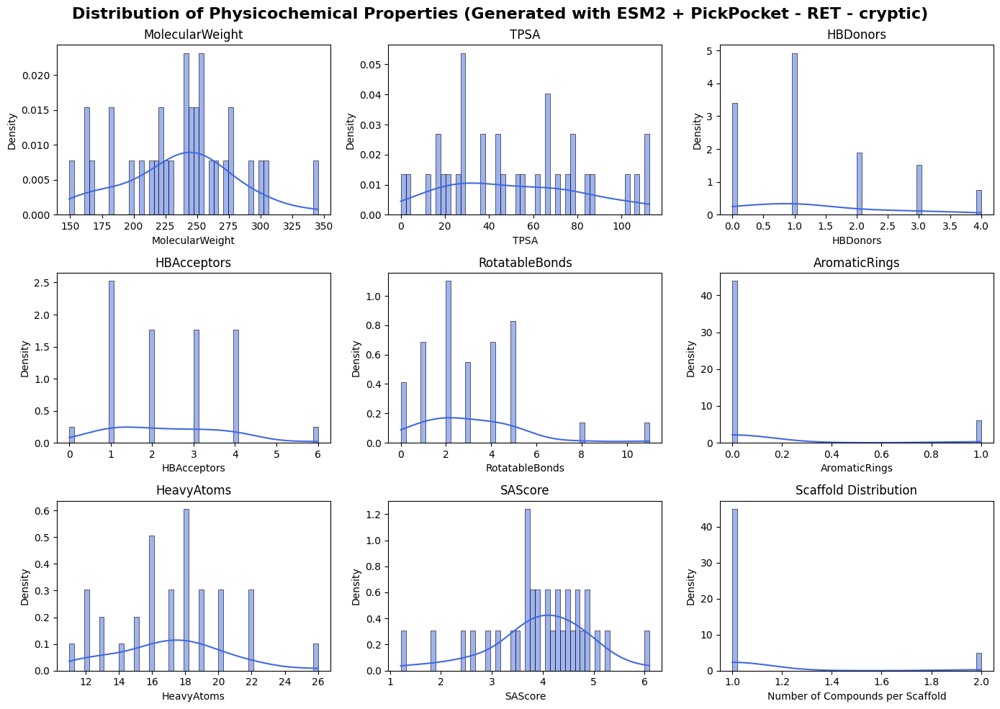

Synthetic Accessibility Score - Mean: 3.944, SD: 0.989
Analysis complete for: Generated with ESM2 + PickPocket - RET - cryptic
Starting analysis for: Generated with ESM2 + PickPocket - RET - active


100%|██████████| 32/32 [00:00<00:00, 658.83it/s]

Molecular property computation complete!


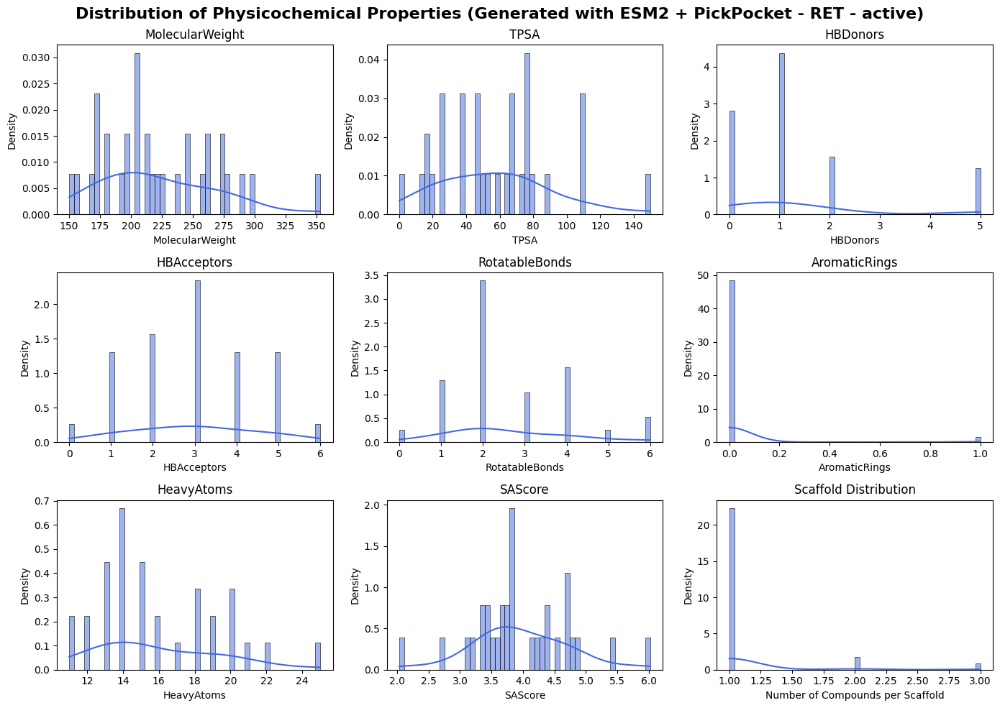

Synthetic Accessibility Score - Mean: 3.971, SD: 0.782
Analysis complete for: Generated with ESM2 + PickPocket - RET - active


In [142]:
df_ESM2_pocket_infere_cryptic = analyze_molecules(esm2_cryptic_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 + PickPocket - RET - cryptic", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')
df_ESM2_pocket_infere_active = analyze_molecules(esm2_active_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with ESM2 + PickPocket - RET - active", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')

### SaProt + PickPocket

In [144]:
SaProt_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/SaProt_RET_toinfere_id.csv', sep=',')

In [145]:
# Split based on site_type
saprot_cryptic_site_df = SaProt_pocket_toinfere[SaProt_pocket_toinfere['site_type'] == 'cryptic site']
saprot_active_site_df = SaProt_pocket_toinfere[SaProt_pocket_toinfere['site_type'] == 'active site']

Starting analysis for: Generated with SaProt + PickPocket - cryptic


100%|██████████| 26/26 [00:00<00:00, 648.86it/s]

Molecular property computation complete!


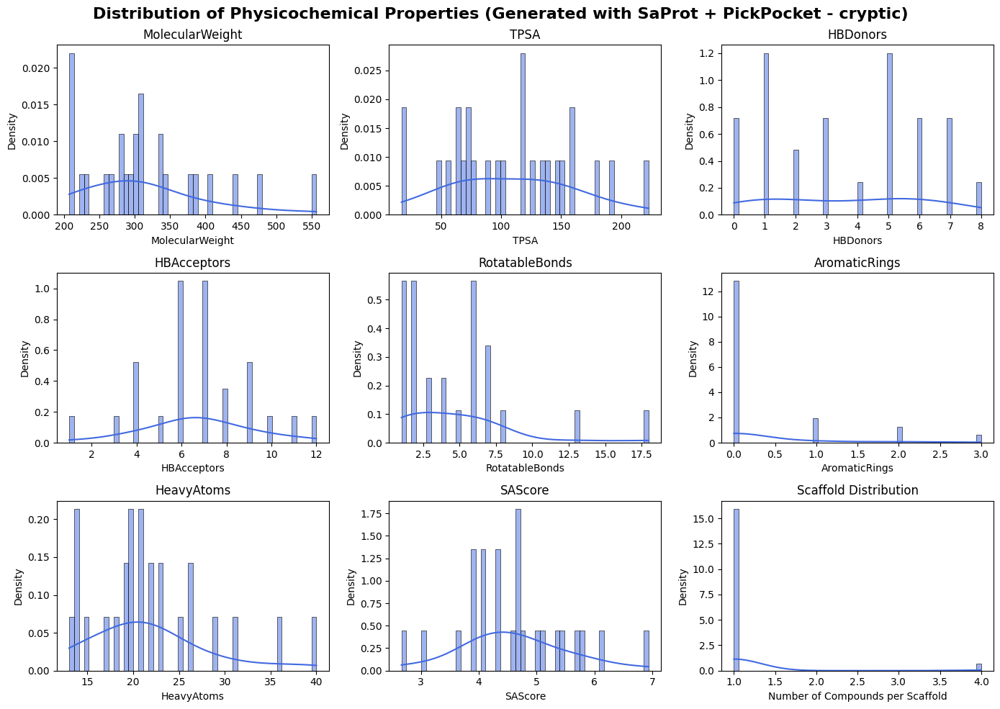

Synthetic Accessibility Score - Mean: 4.612, SD: 0.936
Analysis complete for: Generated with SaProt + PickPocket - cryptic
Starting analysis for: Generated with SaProt + PickPocket - active


100%|██████████| 29/29 [00:00<00:00, 702.43it/s]

Molecular property computation complete!


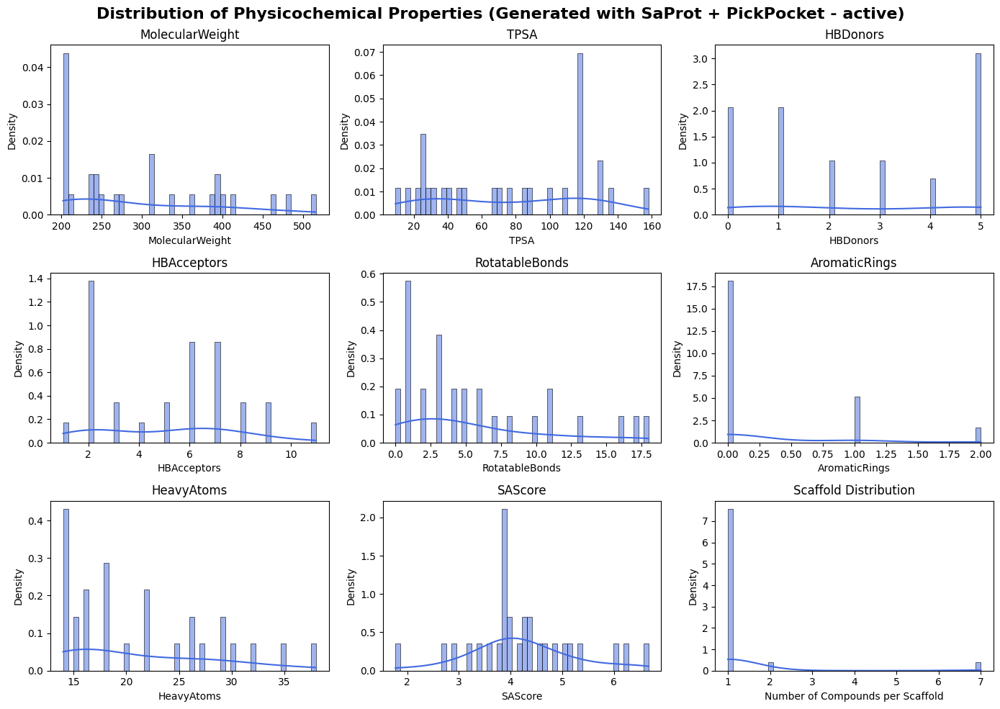

Synthetic Accessibility Score - Mean: 4.223, SD: 1.037
Analysis complete for: Generated with SaProt + PickPocket - active


In [146]:
df_SaProt_pocket_infere_cryptic = analyze_molecules(saprot_cryptic_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with SaProt + PickPocket - cryptic", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')
df_SaProt_pocket_infere_active = analyze_molecules(saprot_active_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with SaProt + PickPocket - active", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')

### TensorDTI + PickPocket

In [147]:
Tensor_pocket_toinfere = pd.read_csv('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/generated_smiles/to_DTI/TensorDTI_RET_toinfere_id.csv', sep=',')

In [148]:
# Split based on site_type
tensor_cryptic_site_df = Tensor_pocket_toinfere[Tensor_pocket_toinfere['site_type'] == 'cryptic site']
tensor_active_site_df = Tensor_pocket_toinfere[Tensor_pocket_toinfere['site_type'] == 'active site']

Starting analysis for: Generated with  Tensor Prot+Pocket - cryptic


100%|██████████| 79/79 [00:00<00:00, 304.95it/s]


Molecular property computation complete!


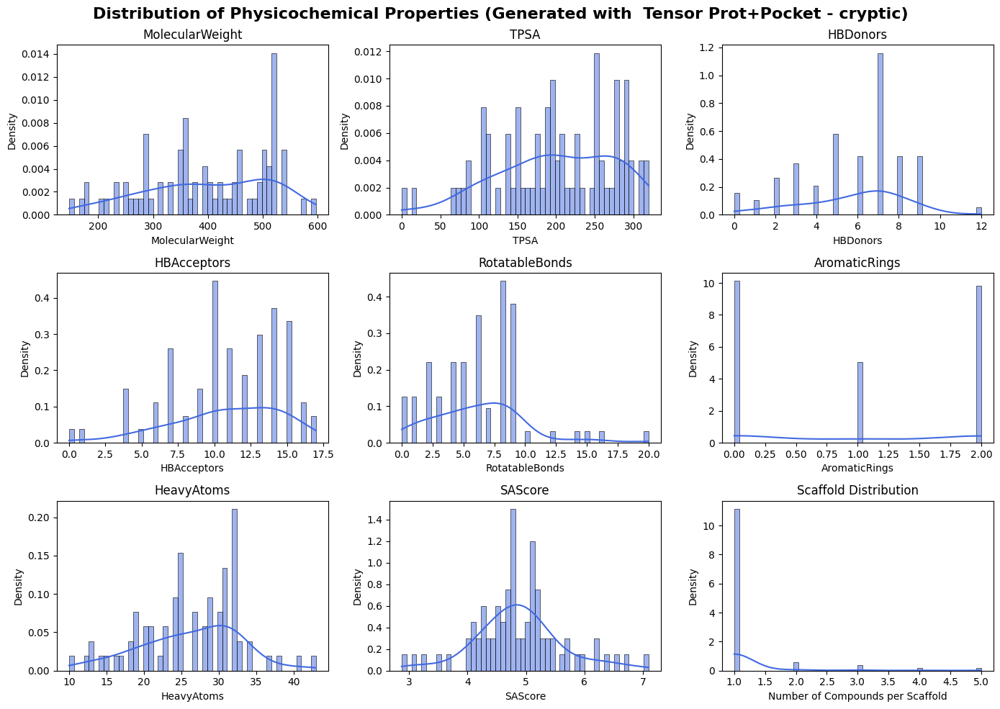

Synthetic Accessibility Score - Mean: 4.871, SD: 0.756
Analysis complete for: Generated with  Tensor Prot+Pocket - cryptic
Starting analysis for: Generated with Tensor Prot+Pocket - active


100%|██████████| 92/92 [00:00<00:00, 379.94it/s]


Molecular property computation complete!


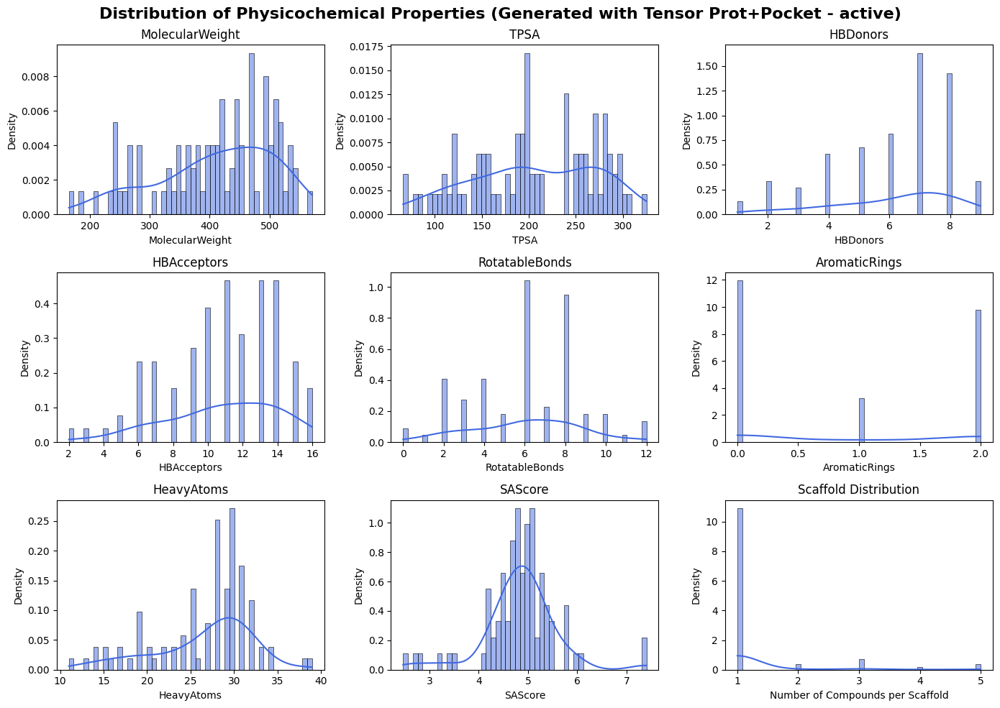

Synthetic Accessibility Score - Mean: 4.843, SD: 0.743
Analysis complete for: Generated with Tensor Prot+Pocket - active


In [149]:
df_tensor_pocket_infere_cryptic = analyze_molecules(tensor_cryptic_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with  Tensor Prot+Pocket - cryptic", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')
df_tensor_pocket_infere_active = analyze_molecules(tensor_active_site_df, smiles_column="smiles", valid_column="valid", dataset_name="Generated with Tensor Prot+Pocket - active", save_plots=False, output_dir='/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/retro/')

### Comparisons between models

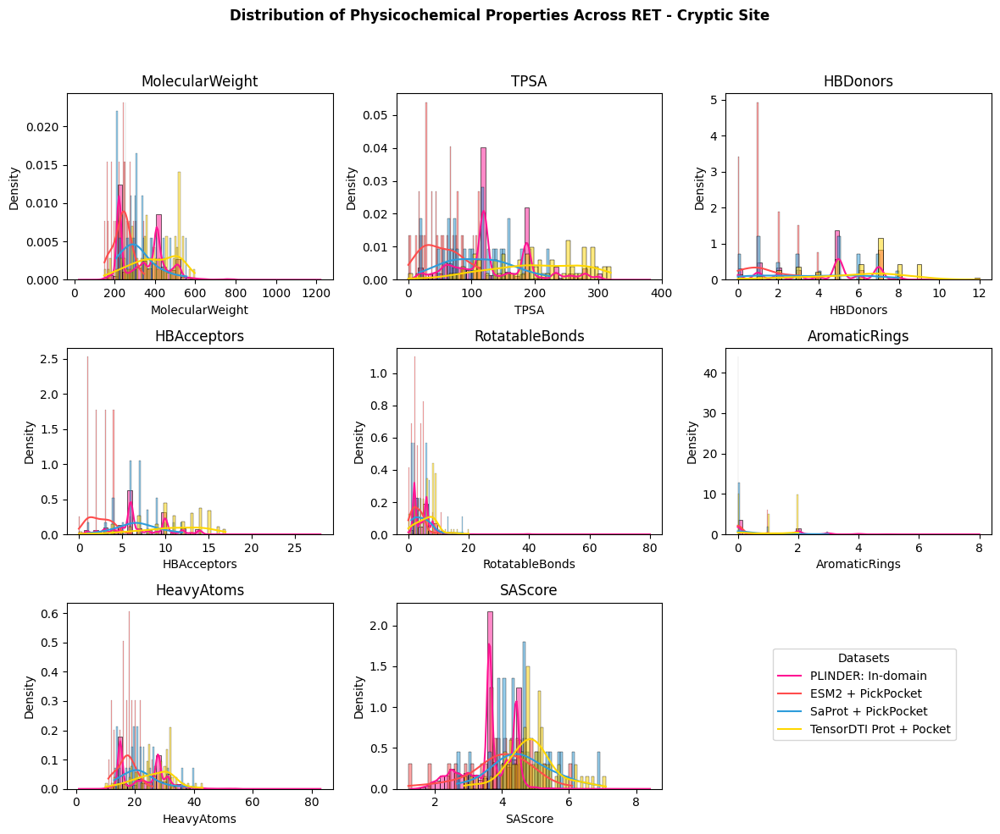

In [150]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: In-domain": virus_properties_train,
    "ESM2 + PickPocket": df_ESM2_pocket_infere_cryptic,
    "SaProt + PickPocket": df_SaProt_pocket_infere_cryptic,
    "TensorDTI Prot + Pocket": df_tensor_pocket_infere_cryptic,
}
plinder_color = '#FF1493'
colors = [plinder_color, "#FF4C4C", "#2D9CDB", "#FFD700"]

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across RET - Cryptic Site", #{', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"RET-cryptic_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()

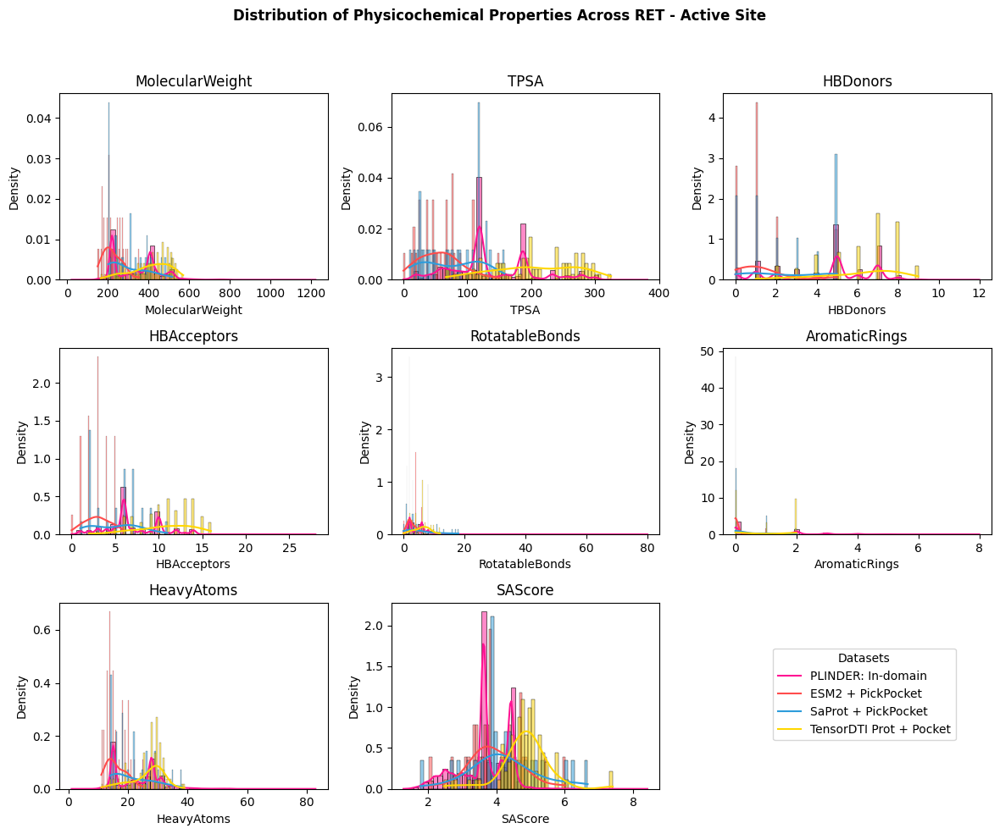

In [152]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of properties to plot
properties = ["MolecularWeight", "TPSA", "HBDonors", "HBAcceptors", "RotatableBonds", "AromaticRings", "HeavyAtoms", "SAScore"]

# Define dataset names and colors
datasets = {
    "PLINDER: In-domain": virus_properties_train,
    "ESM2 + PickPocket": df_ESM2_pocket_infere_active,
    "SaProt + PickPocket": df_SaProt_pocket_infere_active,
    "TensorDTI Prot + Pocket": df_tensor_pocket_infere_active,
}
plinder_color = '#FF1493'
colors = [plinder_color, "#FF4C4C", "#2D9CDB", "#FFD700"]

legend_handles = []  # Store one handle per dataset
legend_labels = []

# Set up the figure size
fig = plt.figure(figsize=(14, 10))
#fig.suptitle(f"Distribution of Physicochemical Properties Across {', '.join(datasets.keys())}", fontsize=12, fontweight="bold")  # General title
fig.suptitle(
    f"Distribution of Physicochemical Properties Across RET - Active Site", #{', '.join(datasets.keys())}",
    fontsize=12, fontweight="bold", x=0.425  # Adjust this value to center visually
)

# Plot histograms for each property
for i, prop in enumerate(properties, 1):
    ax = plt.subplot(3, 3, i)

    for (label, dataset), color in zip(datasets.items(), colors):
        sns.histplot(dataset[prop], bins=50, kde=True, stat="density", color=color, label=label, alpha=0.5, ax=ax)

        # Collect legend handles only from the first subplot
        if i == 1:
            handle = ax.get_lines()[-1]  # sns.histplot returns bars + kde line
            legend_handles.append(handle)
            legend_labels.append(label)

    ax.set_title(f"{prop}")
    ax.set_xlabel(prop)
    ax.set_ylabel("Density")

# Add legend only once outside the loop
#fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(1.0, 0.5), title="Datasets")
#plt.tight_layout()
#plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/', f"virus_no_virus_physicochemical_distributions.png"), dpi=300)
#plt.show()

# Arrange subplots nicely first
fig.tight_layout(rect=[0, 0, 0.85, 0.95])  # Leave space on the right for legend

# Add legend AFTER layout
fig.legend(legend_handles, legend_labels, loc="center left", bbox_to_anchor=(0.65, 0.17), title="Datasets")

# Save AFTER legend is placed
plt.savefig(os.path.join('/content/drive/MyDrive/Binder_Generation/protein_pocket_analysis/plots/ESM2/',
                         f"RET-active_physicochemical_distributions.png"),
            dpi=300, bbox_inches='tight')  # Also helps to ensure legend is not clipped

plt.show()